# 

In [1]:
import torch

print("CUDA available:", torch.cuda.is_available())
print("GPU count:", torch.cuda.device_count())

for i in range(torch.cuda.device_count()):
    print(f"GPU {i}:", torch.cuda.get_device_name(i))

CUDA available: True
GPU count: 2
GPU 0: Tesla T4
GPU 1: Tesla T4


In [2]:
!pip install -q kagglehub

import kagglehub
from pathlib import Path

# Download MVTec AD directly from Kaggle
mvtec_path = kagglehub.dataset_download(
    "ipythonx/mvtec-ad"
)

MVTEC_PATH = Path(mvtec_path)

print("=" * 60)
print("MVTec AD")
print("=" * 60)

print("Path:", MVTEC_PATH)
print("Exists:", MVTEC_PATH.exists())

categories = sorted([
    p.name
    for p in MVTEC_PATH.iterdir()
    if p.is_dir()
])

print("Categories:", len(categories))
print(categories)

assert len(categories) == 15

print("\nMVTec AD READY")

Mounting files to /kaggle/input/datasets/ipythonx/mvtec-ad...
MVTec AD
Path: /kaggle/input/datasets/ipythonx/mvtec-ad
Exists: True
Categories: 15
['bottle', 'cable', 'capsule', 'carpet', 'grid', 'hazelnut', 'leather', 'metal_nut', 'pill', 'screw', 'tile', 'toothbrush', 'transistor', 'wood', 'zipper']

MVTec AD READY


In [3]:
# ============================================================
# KAGGLE RECOVERY
# BUILD FULL 15-CATEGORY YOLO SEGMENTATION DATASET
# ============================================================

import cv2
import yaml
import shutil
import random
import numpy as np

from pathlib import Path
from collections import defaultdict
from sklearn.model_selection import train_test_split


# ============================================================
# SETTINGS
# ============================================================

SEED = 42

random.seed(SEED)
np.random.seed(SEED)

ALL_CATEGORIES = [
    "bottle",
    "cable",
    "capsule",
    "carpet",
    "grid",
    "hazelnut",
    "leather",
    "metal_nut",
    "pill",
    "screw",
    "tile",
    "toothbrush",
    "transistor",
    "wood",
    "zipper"
]

YOLO_DIR_15 = Path(
    "/kaggle/working/mvtec_yolo_seg_15cat"
)

print("=" * 70)
print("KAGGLE FULL DATASET RECOVERY")
print("=" * 70)

print("MVTec path :", MVTEC_PATH)
print("YOLO path  :", YOLO_DIR_15)


# ============================================================
# 1. COLLECT ALL DEFECTIVE IMAGES + MASKS
# ============================================================

all_defective_samples = []
missing_masks = []

for category in ALL_CATEGORIES:

    category_path = MVTEC_PATH / category

    test_dir = category_path / "test"
    gt_dir = category_path / "ground_truth"

    defect_types = sorted([
        p.name
        for p in test_dir.iterdir()
        if p.is_dir() and p.name != "good"
    ])

    for defect_type in defect_types:

        image_dir = test_dir / defect_type
        mask_dir = gt_dir / defect_type

        for image_path in sorted(
            image_dir.glob("*.png")
        ):

            mask_path = (
                mask_dir /
                f"{image_path.stem}_mask.png"
            )

            if not mask_path.exists():

                missing_masks.append(
                    str(mask_path)
                )

                continue

            all_defective_samples.append({
                "category": category,
                "defect_type": defect_type,
                "image": image_path,
                "mask": mask_path
            })


print("\nDefective images :", len(all_defective_samples))
print("Missing masks    :", len(missing_masks))

assert len(all_defective_samples) == 1258
assert len(missing_masks) == 0


# ============================================================
# 2. COLLECT TRAIN/GOOD
# ============================================================

good_by_category = defaultdict(list)

for category in ALL_CATEGORIES:

    good_dir = (
        MVTEC_PATH /
        category /
        "train" /
        "good"
    )

    good_by_category[category] = sorted(
        good_dir.glob("*.png")
    )


total_available_good = sum(
    len(v)
    for v in good_by_category.values()
)

print(
    "Available train/good:",
    total_available_good
)

assert total_available_good == 3629


# ============================================================
# 3. SELECT 1,258 GOOD IMAGES
# ============================================================

TARGET_GOOD = len(
    all_defective_samples
)

base_per_category = (
    TARGET_GOOD //
    len(ALL_CATEGORIES)
)

remainder = (
    TARGET_GOOD %
    len(ALL_CATEGORIES)
)

selected_good_samples = []

random.seed(SEED)

for i, category in enumerate(
    ALL_CATEGORIES
):

    target = (
        base_per_category +
        (1 if i < remainder else 0)
    )

    available = (
        good_by_category[category]
    )

    n_select = min(
        target,
        len(available)
    )

    selected = random.sample(
        available,
        n_select
    )

    for image_path in selected:

        selected_good_samples.append({
            "category": category,
            "defect_type": "good",
            "image": image_path,
            "mask": None
        })


# Fill any shortage
selected_paths = {
    str(s["image"])
    for s in selected_good_samples
}

remaining_needed = (
    TARGET_GOOD -
    len(selected_good_samples)
)

if remaining_needed > 0:

    remaining_pool = []

    for category in ALL_CATEGORIES:

        for image_path in (
            good_by_category[category]
        ):

            if (
                str(image_path)
                not in selected_paths
            ):

                remaining_pool.append(
                    (category, image_path)
                )

    extra = random.sample(
        remaining_pool,
        remaining_needed
    )

    for category, image_path in extra:

        selected_good_samples.append({
            "category": category,
            "defect_type": "good",
            "image": image_path,
            "mask": None
        })


print(
    "Selected good     :",
    len(selected_good_samples)
)

assert len(
    selected_good_samples
) == 1258


# ============================================================
# 4. SPLIT DEFECTIVE — 70 / 15 / 15
# ============================================================

defective_strata = [
    f"{s['category']}__{s['defect_type']}"
    for s in all_defective_samples
]

def_train, def_temp = train_test_split(
    all_defective_samples,
    test_size=0.30,
    random_state=SEED,
    stratify=defective_strata
)

temp_strata = [
    f"{s['category']}__{s['defect_type']}"
    for s in def_temp
]

def_val, def_test = train_test_split(
    def_temp,
    test_size=0.50,
    random_state=SEED,
    stratify=temp_strata
)


# ============================================================
# 5. SPLIT GOOD — 70 / 15 / 15
# ============================================================

good_strata = [
    s["category"]
    for s in selected_good_samples
]

good_train, good_temp = train_test_split(
    selected_good_samples,
    test_size=0.30,
    random_state=SEED,
    stratify=good_strata
)

good_temp_strata = [
    s["category"]
    for s in good_temp
]

good_val, good_test = train_test_split(
    good_temp,
    test_size=0.50,
    random_state=SEED,
    stratify=good_temp_strata
)


# ============================================================
# 6. COMBINE
# ============================================================

train_samples_15 = (
    def_train +
    good_train
)

val_samples_15 = (
    def_val +
    good_val
)

test_samples_15 = (
    def_test +
    good_test
)


print("\nSplit:")

print(
    f"Train: {len(train_samples_15)} "
    f"({len(def_train)} defective + "
    f"{len(good_train)} good)"
)

print(
    f"Val  : {len(val_samples_15)} "
    f"({len(def_val)} defective + "
    f"{len(good_val)} good)"
)

print(
    f"Test : {len(test_samples_15)} "
    f"({len(def_test)} defective + "
    f"{len(good_test)} good)"
)


# ============================================================
# 7. CHECK 73 DEFECT TYPES
# ============================================================

all_types = {
    f"{s['category']}/{s['defect_type']}"
    for s in all_defective_samples
}

train_types = {
    f"{s['category']}/{s['defect_type']}"
    for s in def_train
}

val_types = {
    f"{s['category']}/{s['defect_type']}"
    for s in def_val
}

test_types = {
    f"{s['category']}/{s['defect_type']}"
    for s in def_test
}


print("\nDefect types:")
print("All   :", len(all_types))
print("Train :", len(train_types))
print("Val   :", len(val_types))
print("Test  :", len(test_types))

assert len(all_types) == 73
assert len(train_types) == 73
assert len(val_types) == 73
assert len(test_types) == 73


# ============================================================
# 8. CREATE KAGGLE YOLO DIRECTORY
# ============================================================

if YOLO_DIR_15.exists():

    shutil.rmtree(
        YOLO_DIR_15
    )


for split in [
    "train",
    "val",
    "test"
]:

    (
        YOLO_DIR_15 /
        "images" /
        split
    ).mkdir(
        parents=True,
        exist_ok=True
    )

    (
        YOLO_DIR_15 /
        "labels" /
        split
    ).mkdir(
        parents=True,
        exist_ok=True
    )


# ============================================================
# 9. BINARY MASK -> YOLO SEGMENTATION POLYGONS
# ============================================================

def mask_to_yolo_labels(
    mask_path,
    class_id=0,
    min_area=10
):

    mask = cv2.imread(
        str(mask_path),
        cv2.IMREAD_GRAYSCALE
    )

    if mask is None:
        return []

    h, w = mask.shape

    _, binary = cv2.threshold(
        mask,
        127,
        255,
        cv2.THRESH_BINARY
    )

    contours, _ = cv2.findContours(
        binary,
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE
    )

    labels = []

    for contour in contours:

        if (
            cv2.contourArea(contour)
            < min_area
        ):
            continue

        epsilon = (
            0.001 *
            cv2.arcLength(
                contour,
                True
            )
        )

        polygon = cv2.approxPolyDP(
            contour,
            epsilon,
            True
        )

        if len(polygon) < 3:
            continue

        polygon = polygon.reshape(
            -1,
            2
        )

        coordinates = []

        for x, y in polygon:

            coordinates.extend([
                np.clip(x / w, 0, 1),
                np.clip(y / h, 0, 1)
            ])

        labels.append(
            [class_id] +
            coordinates
        )

    return labels


# ============================================================
# 10. CONVERT ONE SPLIT
# ============================================================

def convert_split(
    samples,
    split_name
):

    defective = 0
    good = 0
    regions = 0
    failed = 0

    for sample in samples:

        category = sample["category"]
        defect_type = sample["defect_type"]

        image_path = sample["image"]
        mask_path = sample["mask"]

        new_stem = (
            f"{category}_"
            f"{defect_type}_"
            f"{image_path.stem}"
        )

        output_image = (
            YOLO_DIR_15 /
            "images" /
            split_name /
            f"{new_stem}.png"
        )

        output_label = (
            YOLO_DIR_15 /
            "labels" /
            split_name /
            f"{new_stem}.txt"
        )

        shutil.copy2(
            image_path,
            output_image
        )

        # GOOD
        if defect_type == "good":

            output_label.touch()

            good += 1

            continue

        # DEFECTIVE
        labels = mask_to_yolo_labels(
            mask_path
        )

        if len(labels) == 0:

            output_label.touch()

            failed += 1

            continue

        with open(
            output_label,
            "w"
        ) as f:

            for label in labels:

                coords = " ".join(
                    f"{v:.6f}"
                    for v in label[1:]
                )

                f.write(
                    f"{int(label[0])} "
                    f"{coords}\n"
                )

        defective += 1

        regions += len(labels)

    return {
        "total": len(samples),
        "defective": defective,
        "good": good,
        "regions": regions,
        "failed": failed
    }


# ============================================================
# 11. CONVERT
# ============================================================

random.seed(SEED)

random.shuffle(
    train_samples_15
)

random.shuffle(
    val_samples_15
)

random.shuffle(
    test_samples_15
)


print("\nConverting images...")


train_stats = convert_split(
    train_samples_15,
    "train"
)

val_stats = convert_split(
    val_samples_15,
    "val"
)

test_stats = convert_split(
    test_samples_15,
    "test"
)


# ============================================================
# 12. CREATE data.yaml
# ============================================================

data_yaml = {
    "path": str(YOLO_DIR_15),
    "train": "images/train",
    "val": "images/val",
    "test": "images/test",
    "names": {
        0: "defect"
    }
}

DATA_YAML = (
    YOLO_DIR_15 /
    "data.yaml"
)

with open(
    DATA_YAML,
    "w"
) as f:

    yaml.safe_dump(
        data_yaml,
        f,
        sort_keys=False
    )


# ============================================================
# 13. FINAL CHECK
# ============================================================

print("\n" + "=" * 70)
print("KAGGLE RECOVERY COMPLETE")
print("=" * 70)

for name, stats in [
    ("TRAIN", train_stats),
    ("VAL", val_stats),
    ("TEST", test_stats)
]:

    print(f"\n{name}")

    print(
        "Images     :",
        stats["total"]
    )

    print(
        "Defective  :",
        stats["defective"]
    )

    print(
        "Good       :",
        stats["good"]
    )

    print(
        "Regions    :",
        stats["regions"]
    )

    print(
        "Failed     :",
        stats["failed"]
    )


# ============================================================
# 14. ASSERTIONS
# ============================================================

assert train_stats["total"] == 1760
assert val_stats["total"] == 378
assert test_stats["total"] == 378

assert train_stats["defective"] == 880
assert val_stats["defective"] == 189
assert test_stats["defective"] == 189

assert train_stats["good"] == 880
assert val_stats["good"] == 189
assert test_stats["good"] == 189

assert train_stats["failed"] == 0
assert val_stats["failed"] == 0
assert test_stats["failed"] == 0


print("\nDataset :", YOLO_DIR_15)
print("YAML    :", DATA_YAML)

print("\nALL CHECKS PASSED")

KAGGLE FULL DATASET RECOVERY
MVTec path : /kaggle/input/datasets/ipythonx/mvtec-ad
YOLO path  : /kaggle/working/mvtec_yolo_seg_15cat

Defective images : 1258
Missing masks    : 0
Available train/good: 3629
Selected good     : 1258

Split:
Train: 1760 (880 defective + 880 good)
Val  : 378 (189 defective + 189 good)
Test : 378 (189 defective + 189 good)

Defect types:
All   : 73
Train : 73
Val   : 73
Test  : 73

Converting images...

KAGGLE RECOVERY COMPLETE

TRAIN
Images     : 1760
Defective  : 880
Good       : 880
Regions    : 1309
Failed     : 0

VAL
Images     : 378
Defective  : 189
Good       : 189
Regions    : 292
Failed     : 0

TEST
Images     : 378
Defective  : 189
Good       : 189
Regions    : 287
Failed     : 0

Dataset : /kaggle/working/mvtec_yolo_seg_15cat
YAML    : /kaggle/working/mvtec_yolo_seg_15cat/data.yaml

ALL CHECKS PASSED


In [4]:
# ============================================================
# TRAIN YOLOv8s-SEG — 15 CATEGORIES — 2x T4
# ============================================================

!pip install -q ultralytics

from ultralytics import YOLO
from pathlib import Path
import torch

# ============================================================
# 1. GPU CHECK
# ============================================================

print("=" * 70)
print("GPU CHECK")
print("=" * 70)

print("CUDA available:", torch.cuda.is_available())
print("GPU count     :", torch.cuda.device_count())

for i in range(torch.cuda.device_count()):
    print(
        f"GPU {i}:",
        torch.cuda.get_device_name(i)
    )

assert torch.cuda.is_available()
assert torch.cuda.device_count() >= 2


# ============================================================
# 2. PATHS
# ============================================================

DATA_YAML = Path(
    "/kaggle/working/mvtec_yolo_seg_15cat/data.yaml"
)

RUNS_DIR = Path(
    "/kaggle/working/runs"
)

RUNS_DIR.mkdir(
    parents=True,
    exist_ok=True
)

assert DATA_YAML.exists()

print("\nDataset YAML:", DATA_YAML)
print("Runs folder :", RUNS_DIR)


# ============================================================
# 3. LOAD PRETRAINED YOLOv8s SEGMENTATION MODEL
# ============================================================

model_15 = YOLO(
    "yolov8s-seg.pt"
)


# ============================================================
# 4. TRAIN
# ============================================================

train_results_15 = model_15.train(

    # Dataset
    data=str(DATA_YAML),

    # --------------------------------------------------------
    # Training
    # --------------------------------------------------------
    epochs=80,
    imgsz=640,

    # Total batch across both GPUs
    batch=16,

    # --------------------------------------------------------
    # Multi-GPU
    # --------------------------------------------------------
    device=[0, 1],

    # --------------------------------------------------------
    # Optimizer
    # --------------------------------------------------------
    optimizer="AdamW",
    lr0=0.001,

    # --------------------------------------------------------
    # Early stopping
    # --------------------------------------------------------
    patience=15,

    # --------------------------------------------------------
    # Augmentation
    # --------------------------------------------------------
    close_mosaic=10,

    # --------------------------------------------------------
    # Data loading
    # --------------------------------------------------------
    workers=4,

    # --------------------------------------------------------
    # Saving
    # --------------------------------------------------------
    project=str(RUNS_DIR),

    name="industrial_defect_15cat_yolov8s_seg",

    exist_ok=True,

    save=True,

    # checkpoint every 5 epochs
    save_period=5,

    # --------------------------------------------------------
    # Reproducibility
    # --------------------------------------------------------
    seed=42,
    deterministic=True,

    # --------------------------------------------------------
    # Results
    # --------------------------------------------------------
    plots=True,
    verbose=True
)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.6/46.6 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 32.0 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.8/75.8 kB 5.2 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.8 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/usage/settings.
GPU CHECK
CUDA available: True
GPU count     : 2
GPU 0: Tesla T4
GPU 1: Tesla T4

Dataset YAML: /kaggle/working/mvtec_yolo_seg_15cat/data.yaml
Runs folder : /kaggle/working/runs
Ultralytics 8.4.150 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
                                                        CUDA:1 (Tesla T4, 14912MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=

/usr/local/lib/python3.12/dist-packages/ray/train/_internal/session.py:676: UserWarning: `get_trial_id` is meant to only be called inside a function that is executed by a Tuner or Trainer. Returning `None`.
  warnings.warn(



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
       2/80      2.71G        2.1      3.866       2.96      1.918          0          7        640: 100% ━━━━━━━━━━━━ 110/110 3.1it/s 35.3s0.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 2.1it/s 5.6s0.4s
                   all        378        292      0.193      0.103     0.0784     0.0346      0.243     0.0753     0.0568     0.0165

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
       3/80      2.71G       2.12      3.756       3.05      1.993          0          7        640: 100% ━━━━━━━━━━━━ 110/110 3.2it/s 34.9s0.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 1.9it/s 6.2s0.4s
                   all   

In [5]:
# ============================================================
# FINAL TEST EVALUATION — 15 CATEGORY MODEL
# ============================================================

from ultralytics import YOLO
from pathlib import Path

BEST_MODEL = Path(
    "/kaggle/working/runs/"
    "industrial_defect_15cat_yolov8s_seg/"
    "weights/best.pt"
)

DATA_YAML = Path(
    "/kaggle/working/mvtec_yolo_seg_15cat/data.yaml"
)

assert BEST_MODEL.exists(), f"Model not found: {BEST_MODEL}"
assert DATA_YAML.exists(), f"YAML not found: {DATA_YAML}"

print("=" * 70)
print("FINAL TEST EVALUATION")
print("=" * 70)

print("Model :", BEST_MODEL)
print("Data  :", DATA_YAML)

# Load BEST model
best_model_15 = YOLO(str(BEST_MODEL))

# Evaluate ONLY on test split
test_results_15 = best_model_15.val(
    data=str(DATA_YAML),
    split="test",
    imgsz=640,
    batch=16,
    device=0,
    workers=4,
    plots=True,
    verbose=True
)

# ============================================================
# RESULTS
# ============================================================

print("\n" + "=" * 70)
print("FINAL TEST RESULTS")
print("=" * 70)

print("\nBOX METRICS")
print("-" * 40)
print(f"Precision   : {test_results_15.box.mp:.4f}")
print(f"Recall      : {test_results_15.box.mr:.4f}")
print(f"mAP50       : {test_results_15.box.map50:.4f}")
print(f"mAP50-95    : {test_results_15.box.map:.4f}")

print("\nMASK METRICS")
print("-" * 40)
print(f"Precision   : {test_results_15.seg.mp:.4f}")
print(f"Recall      : {test_results_15.seg.mr:.4f}")
print(f"mAP50       : {test_results_15.seg.map50:.4f}")
print(f"mAP50-95    : {test_results_15.seg.map:.4f}")

print("\n" + "=" * 70)
print("TEST EVALUATION COMPLETE")
print("=" * 70)

FINAL TEST EVALUATION
Model : /kaggle/working/runs/industrial_defect_15cat_yolov8s_seg/weights/best.pt
Data  : /kaggle/working/mvtec_yolo_seg_15cat/data.yaml
Ultralytics 8.4.150 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
YOLOv8s-seg summary (fused): 85 layers, 11,779,987 parameters, 0 gradients, 39.9 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3661.9±546.7 MB/s, size: 760.4 KB)
val: Scanning /kaggle/working/mvtec_yolo_seg_15cat/labels/test... 378 images, 189 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 378/378 166.2it/s 2.3s0.2s
val: New cache created: /kaggle/working/mvtec_yolo_seg_15cat/labels/test.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 24/24 2.9it/s 8.2s0.3s
                   all        378        287      0.855      0.783      0.852      0.532      0.913      0.697      0.815      0.448
Speed: 1.8ms preprocess, 11.5ms inference, 0.0m

In [6]:
# ============================================================
# IMAGE-LEVEL QUALITY INSPECTION EVALUATION
# Good = PASS
# Defective = REJECT
# ============================================================

from pathlib import Path
from ultralytics import YOLO
import numpy as np

TEST_IMAGES = Path(
    "/kaggle/working/mvtec_yolo_seg_15cat/images/test"
)

TEST_LABELS = Path(
    "/kaggle/working/mvtec_yolo_seg_15cat/labels/test"
)

BEST_MODEL = Path(
    "/kaggle/working/runs/"
    "industrial_defect_15cat_yolov8s_seg/"
    "weights/best.pt"
)

model = YOLO(str(BEST_MODEL))

# ------------------------------------------------------------
# Run predictions on ALL test images
# ------------------------------------------------------------

results = model.predict(
    source=str(TEST_IMAGES),
    imgsz=640,
    conf=0.25,
    device=0,
    batch=16,
    verbose=False
)

TP = 0   # Defective -> REJECT
TN = 0   # Good      -> PASS
FP = 0   # Good      -> REJECT
FN = 0   # Defective -> PASS

false_positives = []
false_negatives = []

good_total = 0
defective_total = 0

for result in results:

    image_path = Path(result.path)

    label_path = TEST_LABELS / f"{image_path.stem}.txt"

    # --------------------------------------------------------
    # Ground Truth
    # Empty label     = Good
    # Non-empty label = Defective
    # --------------------------------------------------------

    label_text = label_path.read_text().strip()

    is_defective_gt = len(label_text) > 0

    # --------------------------------------------------------
    # Prediction
    # Any detected defect = REJECT
    # No detected defect  = PASS
    # --------------------------------------------------------

    detections = len(result.boxes)

    predicted_defective = detections > 0

    max_conf = (
        float(result.boxes.conf.max().cpu())
        if detections > 0
        else 0.0
    )

    # --------------------------------------------------------
    # Confusion Matrix
    # --------------------------------------------------------

    if is_defective_gt:

        defective_total += 1

        if predicted_defective:
            TP += 1
        else:
            FN += 1
            false_negatives.append(image_path.name)

    else:

        good_total += 1

        if predicted_defective:
            FP += 1

            false_positives.append({
                "image": image_path.name,
                "detections": detections,
                "max_confidence": max_conf
            })

        else:
            TN += 1


# ============================================================
# METRICS
# ============================================================

total = TP + TN + FP + FN

accuracy = (TP + TN) / total

precision = TP / (TP + FP) if (TP + FP) else 0

recall = TP / (TP + FN) if (TP + FN) else 0

specificity = TN / (TN + FP) if (TN + FP) else 0

f1 = (
    2 * precision * recall / (precision + recall)
    if (precision + recall)
    else 0
)


# ============================================================
# PRINT RESULTS
# ============================================================

print("=" * 70)
print("IMAGE-LEVEL INDUSTRIAL QUALITY CONTROL RESULTS")
print("=" * 70)

print(f"\nTotal test images : {total}")
print(f"Good images       : {good_total}")
print(f"Defective images  : {defective_total}")

print("\nCONFUSION MATRIX")
print("-" * 40)

print(f"TP | Defect -> REJECT : {TP}")
print(f"TN | Good   -> PASS   : {TN}")
print(f"FP | Good   -> REJECT : {FP}")
print(f"FN | Defect -> PASS   : {FN}")

print("\nQUALITY CONTROL METRICS")
print("-" * 40)

print(f"Accuracy    : {accuracy * 100:.2f}%")
print(f"Precision   : {precision * 100:.2f}%")
print(f"Recall      : {recall * 100:.2f}%")
print(f"Specificity : {specificity * 100:.2f}%")
print(f"F1 Score    : {f1 * 100:.2f}%")

print("\nFALSE POSITIVES")
print("-" * 40)

if false_positives:
    for item in false_positives:
        print(
            f"{item['image']:<45} "
            f"detections={item['detections']:<3} "
            f"confidence={item['max_confidence']:.3f}"
        )
else:
    print("None")

print("\nFALSE NEGATIVES")
print("-" * 40)

if false_negatives:
    for name in false_negatives:
        print(name)
else:
    print("None")

print("\n" + "=" * 70)
print("IMAGE-LEVEL EVALUATION COMPLETE")
print("=" * 70)

IMAGE-LEVEL INDUSTRIAL QUALITY CONTROL RESULTS

Total test images : 378
Good images       : 189
Defective images  : 189

CONFUSION MATRIX
----------------------------------------
TP | Defect -> REJECT : 172
TN | Good   -> PASS   : 184
FP | Good   -> REJECT : 5
FN | Defect -> PASS   : 17

QUALITY CONTROL METRICS
----------------------------------------
Accuracy    : 94.18%
Precision   : 97.18%
Recall      : 91.01%
Specificity : 97.35%
F1 Score    : 93.99%

FALSE POSITIVES
----------------------------------------
hazelnut_good_310.png                         detections=1   confidence=0.636
tile_good_112.png                             detections=1   confidence=0.606
toothbrush_good_006.png                       detections=1   confidence=0.296
toothbrush_good_017.png                       detections=1   confidence=0.278
wood_good_159.png                             detections=1   confidence=0.386

FALSE NEGATIVES
----------------------------------------
bottle_broken_small_013.png
cable_c

In [7]:
# ============================================================
# PER-CATEGORY IMAGE-LEVEL EVALUATION — 15 CATEGORIES
# ============================================================

from pathlib import Path
from collections import defaultdict
import pandas as pd
import numpy as np

ALL_CATEGORIES = [
    "bottle",
    "cable",
    "capsule",
    "carpet",
    "grid",
    "hazelnut",
    "leather",
    "metal_nut",
    "pill",
    "screw",
    "tile",
    "toothbrush",
    "transistor",
    "wood",
    "zipper"
]

TEST_LABELS = Path(
    "/kaggle/working/mvtec_yolo_seg_15cat/labels/test"
)


# ============================================================
# CATEGORY FROM FILENAME
# ============================================================

def get_category_from_filename(filename):

    for category in sorted(
        ALL_CATEGORIES,
        key=len,
        reverse=True
    ):

        if filename.startswith(category + "_"):
            return category

    return "unknown"


# ============================================================
# STORAGE
# ============================================================

stats = defaultdict(
    lambda: {
        "TP": 0,
        "TN": 0,
        "FP": 0,
        "FN": 0,
        "Good": 0,
        "Defective": 0
    }
)


# ============================================================
# USE PREDICTIONS FROM PREVIOUS CELL
# ============================================================

for result in results:

    image_path = Path(result.path)

    category = get_category_from_filename(
        image_path.name
    )

    if category == "unknown":
        print(
            "Unknown category:",
            image_path.name
        )
        continue

    label_path = (
        TEST_LABELS /
        f"{image_path.stem}.txt"
    )

    label_text = (
        label_path
        .read_text()
        .strip()
    )

    # Ground truth
    is_defective = (
        len(label_text) > 0
    )

    # Prediction
    predicted_defective = (
        len(result.boxes) > 0
    )


    # ========================================================
    # COUNTS
    # ========================================================

    if is_defective:

        stats[category]["Defective"] += 1

        if predicted_defective:
            stats[category]["TP"] += 1

        else:
            stats[category]["FN"] += 1

    else:

        stats[category]["Good"] += 1

        if predicted_defective:
            stats[category]["FP"] += 1

        else:
            stats[category]["TN"] += 1


# ============================================================
# CALCULATE METRICS
# ============================================================

rows = []

for category in ALL_CATEGORIES:

    s = stats[category]

    TP = s["TP"]
    TN = s["TN"]
    FP = s["FP"]
    FN = s["FN"]

    total = (
        TP + TN + FP + FN
    )

    accuracy = (
        (TP + TN) / total
        if total else 0
    )

    precision = (
        TP / (TP + FP)
        if (TP + FP) else 0
    )

    recall = (
        TP / (TP + FN)
        if (TP + FN) else 0
    )

    specificity = (
        TN / (TN + FP)
        if (TN + FP) else 0
    )

    f1 = (
        2 * precision * recall /
        (precision + recall)
        if (precision + recall)
        else 0
    )

    rows.append({

        "Category": category,

        "Good": s["Good"],
        "Defective": s["Defective"],

        "TP": TP,
        "TN": TN,
        "FP": FP,
        "FN": FN,

        "Accuracy (%)":
            accuracy * 100,

        "Precision (%)":
            precision * 100,

        "Recall (%)":
            recall * 100,

        "Specificity (%)":
            specificity * 100,

        "F1 (%)":
            f1 * 100
    })


# ============================================================
# DATAFRAME
# ============================================================

category_results = pd.DataFrame(
    rows
)

metric_columns = [
    "Accuracy (%)",
    "Precision (%)",
    "Recall (%)",
    "Specificity (%)",
    "F1 (%)"
]

category_results[
    metric_columns
] = category_results[
    metric_columns
].round(2)


print("=" * 110)
print("PER-CATEGORY QUALITY CONTROL PERFORMANCE")
print("=" * 110)

display(category_results)


# ============================================================
# SORT BY RECALL
# Important for industrial defect detection
# ============================================================

recall_ranking = (
    category_results
    .sort_values(
        by="Recall (%)",
        ascending=True
    )
    .reset_index(drop=True)
)

print("\n" + "=" * 110)
print("CATEGORIES SORTED BY DEFECT RECALL — LOWEST FIRST")
print("=" * 110)

display(
    recall_ranking[
        [
            "Category",
            "Defective",
            "TP",
            "FN",
            "Recall (%)",
            "F1 (%)"
        ]
    ]
)


# ============================================================
# GLOBAL SANITY CHECK
# ============================================================

assert category_results["TP"].sum() == 172
assert category_results["TN"].sum() == 184
assert category_results["FP"].sum() == 5
assert category_results["FN"].sum() == 17

print("\nGLOBAL COUNTS VERIFIED")
print(
    "TP =", category_results["TP"].sum(),
    "| TN =", category_results["TN"].sum(),
    "| FP =", category_results["FP"].sum(),
    "| FN =", category_results["FN"].sum()
)

PER-CATEGORY QUALITY CONTROL PERFORMANCE


,Category,Good,Defective,TP,TN,FP,FN,Accuracy (%),Precision (%),Recall (%),Specificity (%),F1 (%)
0,bottle,13,10,9,13,0,1,95.65,100.00,90.00,100.00,94.74
1,cable,13,14,13,13,0,1,96.30,100.00,92.86,100.00,96.30
2,capsule,12,17,14,12,0,3,89.66,100.00,82.35,100.00,90.32
3,carpet,13,13,13,13,0,0,100.00,100.00,100.00,100.00,100.00
4,grid,13,8,8,13,0,0,100.00,100.00,100.00,100.00,100.00
5,hazelnut,13,9,8,12,1,1,90.91,88.89,88.89,92.31,88.89
6,leather,13,14,14,13,0,0,100.00,100.00,100.00,100.00,100.00
7,metal_nut,13,16,16,13,0,0,100.00,100.00,100.00,100.00,100.00
8,pill,13,21,20,13,0,1,97.06,100.00,95.24,100.00,97.56
9,screw,13,17,11,13,0,6,80.00,100.00,64.71,100.00,78.57



CATEGORIES SORTED BY DEFECT RECALL — LOWEST FIRST


,Category,Defective,TP,FN,Recall (%),F1 (%)
0,transistor,7,3,4,42.86,60.00
1,screw,17,11,6,64.71,78.57
2,capsule,17,14,3,82.35,90.32
3,hazelnut,9,8,1,88.89,88.89
4,bottle,10,9,1,90.00,94.74
5,cable,14,13,1,92.86,96.30
6,pill,21,20,1,95.24,97.56
7,carpet,13,13,0,100.00,100.00
8,metal_nut,16,16,0,100.00,100.00
9,leather,14,14,0,100.00,100.00



GLOBAL COUNTS VERIFIED
TP = 172 | TN = 184 | FP = 5 | FN = 17


In [8]:
# ============================================================
# CONFIDENCE THRESHOLD SWEEP — VALIDATION SET ONLY
# ============================================================

from pathlib import Path
from ultralytics import YOLO
import pandas as pd
import numpy as np

VAL_IMAGES = Path(
    "/kaggle/working/mvtec_yolo_seg_15cat/images/val"
)

VAL_LABELS = Path(
    "/kaggle/working/mvtec_yolo_seg_15cat/labels/val"
)

BEST_MODEL = Path(
    "/kaggle/working/runs/"
    "industrial_defect_15cat_yolov8s_seg/"
    "weights/best.pt"
)

model_threshold = YOLO(str(BEST_MODEL))


# ============================================================
# RUN ONCE AT VERY LOW CONFIDENCE
# ============================================================

val_predictions = model_threshold.predict(
    source=str(VAL_IMAGES),
    imgsz=640,
    conf=0.001,
    device=0,
    batch=16,
    verbose=False
)


# ============================================================
# STORE MAX CONFIDENCE FOR EACH IMAGE
# ============================================================

records = []

for result in val_predictions:

    image_path = Path(result.path)

    label_path = (
        VAL_LABELS /
        f"{image_path.stem}.txt"
    )

    is_defective = bool(
        label_path.read_text().strip()
    )

    if len(result.boxes) > 0:
        max_conf = float(
            result.boxes.conf.max().cpu()
        )
    else:
        max_conf = 0.0

    records.append({
        "image": image_path.name,
        "is_defective": is_defective,
        "max_confidence": max_conf
    })


# ============================================================
# THRESHOLD SWEEP
# ============================================================

thresholds = np.arange(
    0.05,
    0.51,
    0.025
)

rows = []

for threshold in thresholds:

    TP = TN = FP = FN = 0

    for item in records:

        gt = item["is_defective"]

        pred = (
            item["max_confidence"]
            >= threshold
        )

        if gt and pred:
            TP += 1

        elif not gt and not pred:
            TN += 1

        elif not gt and pred:
            FP += 1

        elif gt and not pred:
            FN += 1


    accuracy = (
        (TP + TN) /
        (TP + TN + FP + FN)
    )

    precision = (
        TP / (TP + FP)
        if TP + FP else 0
    )

    recall = (
        TP / (TP + FN)
        if TP + FN else 0
    )

    specificity = (
        TN / (TN + FP)
        if TN + FP else 0
    )

    f1 = (
        2 * precision * recall /
        (precision + recall)
        if precision + recall else 0
    )


    rows.append({

        "Threshold":
            round(float(threshold), 3),

        "TP": TP,
        "TN": TN,
        "FP": FP,
        "FN": FN,

        "Accuracy (%)":
            round(accuracy * 100, 2),

        "Precision (%)":
            round(precision * 100, 2),

        "Recall (%)":
            round(recall * 100, 2),

        "Specificity (%)":
            round(specificity * 100, 2),

        "F1 (%)":
            round(f1 * 100, 2)
    })


threshold_results = pd.DataFrame(
    rows
)

print("=" * 100)
print("VALIDATION CONFIDENCE THRESHOLD SWEEP")
print("=" * 100)

display(threshold_results)


# ============================================================
# BEST F1
# ============================================================

best_f1_row = (
    threshold_results
    .sort_values(
        ["F1 (%)", "Recall (%)"],
        ascending=False
    )
    .iloc[0]
)

print("\n" + "=" * 70)
print("BEST THRESHOLD BY F1")
print("=" * 70)

print(best_f1_row.to_string())


# ============================================================
# INDUSTRIAL OPTION
# Prefer high recall, then lowest FP
# ============================================================

high_recall = threshold_results[
    threshold_results["Recall (%)"] >= 95
]

print("\n" + "=" * 70)
print("THRESHOLDS WITH >= 95% DEFECT RECALL")
print("=" * 70)

if len(high_recall):

    display(high_recall)

else:

    print(
        "No tested threshold achieved "
        "95% validation recall."
    )

VALIDATION CONFIDENCE THRESHOLD SWEEP


,Threshold,TP,TN,FP,FN,Accuracy (%),Precision (%),Recall (%),Specificity (%),F1 (%)
0,0.050,181,178,11,8,94.97,94.27,95.77,94.18,95.01
1,0.075,178,180,9,11,94.71,95.19,94.18,95.24,94.68
2,0.100,176,184,5,13,95.24,97.24,93.12,97.35,95.14
3,0.125,175,185,4,14,95.24,97.77,92.59,97.88,95.11
4,0.150,174,185,4,15,94.97,97.75,92.06,97.88,94.82
5,0.175,174,186,3,15,95.24,98.31,92.06,98.41,95.08
6,0.200,173,186,3,16,94.97,98.30,91.53,98.41,94.79
7,0.225,172,188,1,17,95.24,99.42,91.01,99.47,95.03
8,0.250,171,188,1,18,94.97,99.42,90.48,99.47,94.74
9,0.275,170,188,1,19,94.71,99.42,89.95,99.47,94.44



BEST THRESHOLD BY F1
Threshold            0.10
TP                 176.00
TN                 184.00
FP                   5.00
FN                  13.00
Accuracy (%)        95.24
Precision (%)       97.24
Recall (%)          93.12
Specificity (%)     97.35
F1 (%)              95.14

THRESHOLDS WITH >= 95% DEFECT RECALL


,Threshold,TP,TN,FP,FN,Accuracy (%),Precision (%),Recall (%),Specificity (%),F1 (%)
0,0.05,181,178,11,8,94.97,94.27,95.77,94.18,95.01


In [9]:
# ============================================================
# FINAL LOCKED TEST — SELECTED THRESHOLD = 0.05
# ============================================================

from pathlib import Path
from ultralytics import YOLO

FINAL_THRESHOLD = 0.05

TEST_IMAGES = Path(
    "/kaggle/working/mvtec_yolo_seg_15cat/images/test"
)

TEST_LABELS = Path(
    "/kaggle/working/mvtec_yolo_seg_15cat/labels/test"
)

BEST_MODEL = Path(
    "/kaggle/working/runs/"
    "industrial_defect_15cat_yolov8s_seg/"
    "weights/best.pt"
)

final_model = YOLO(str(BEST_MODEL))

# ============================================================
# PREDICT
# ============================================================

final_results = final_model.predict(
    source=str(TEST_IMAGES),
    imgsz=640,
    conf=FINAL_THRESHOLD,
    device=0,
    batch=16,
    verbose=False
)

TP = TN = FP = FN = 0

false_positives_final = []
false_negatives_final = []

for result in final_results:

    image_path = Path(result.path)

    label_path = (
        TEST_LABELS /
        f"{image_path.stem}.txt"
    )

    # Ground truth
    is_defective = bool(
        label_path.read_text().strip()
    )

    # Prediction
    predicted_defective = (
        len(result.boxes) > 0
    )

    max_conf = (
        float(result.boxes.conf.max().cpu())
        if len(result.boxes) > 0
        else 0.0
    )

    if is_defective and predicted_defective:
        TP += 1

    elif not is_defective and not predicted_defective:
        TN += 1

    elif not is_defective and predicted_defective:
        FP += 1

        false_positives_final.append({
            "image": image_path.name,
            "confidence": max_conf,
            "detections": len(result.boxes)
        })

    elif is_defective and not predicted_defective:
        FN += 1

        false_negatives_final.append(
            image_path.name
        )


# ============================================================
# METRICS
# ============================================================

total = TP + TN + FP + FN

accuracy = (
    (TP + TN) / total
)

precision = (
    TP / (TP + FP)
    if TP + FP else 0
)

recall = (
    TP / (TP + FN)
    if TP + FN else 0
)

specificity = (
    TN / (TN + FP)
    if TN + FP else 0
)

f1 = (
    2 * precision * recall /
    (precision + recall)
    if precision + recall else 0
)


# ============================================================
# RESULTS
# ============================================================

print("=" * 75)
print("FINAL LOCKED INDUSTRIAL QC TEST")
print(f"CONFIDENCE THRESHOLD = {FINAL_THRESHOLD}")
print("=" * 75)

print("\nCONFUSION MATRIX")
print("-" * 45)

print(f"TP | Defect -> REJECT : {TP}")
print(f"TN | Good   -> PASS   : {TN}")
print(f"FP | Good   -> REJECT : {FP}")
print(f"FN | Defect -> PASS   : {FN}")

print("\nFINAL QC METRICS")
print("-" * 45)

print(f"Accuracy    : {accuracy * 100:.2f}%")
print(f"Precision   : {precision * 100:.2f}%")
print(f"Recall      : {recall * 100:.2f}%")
print(f"Specificity : {specificity * 100:.2f}%")
print(f"F1 Score    : {f1 * 100:.2f}%")

print("\nFALSE NEGATIVES")
print("-" * 45)

if false_negatives_final:
    for name in false_negatives_final:
        print(name)
else:
    print("None")

print("\nFALSE POSITIVES")
print("-" * 45)

if false_positives_final:

    for item in false_positives_final:

        print(
            f"{item['image']:<45}"
            f" detections={item['detections']:<3}"
            f" confidence={item['confidence']:.3f}"
        )

else:
    print("None")

print("\n" + "=" * 75)
print("FINAL TEST COMPLETE")
print("=" * 75)

FINAL LOCKED INDUSTRIAL QC TEST
CONFIDENCE THRESHOLD = 0.05

CONFUSION MATRIX
---------------------------------------------
TP | Defect -> REJECT : 181
TN | Good   -> PASS   : 176
FP | Good   -> REJECT : 13
FN | Defect -> PASS   : 8

FINAL QC METRICS
---------------------------------------------
Accuracy    : 94.44%
Precision   : 93.30%
Recall      : 95.77%
Specificity : 93.12%
F1 Score    : 94.52%

FALSE NEGATIVES
---------------------------------------------
bottle_broken_small_013.png
cable_cable_swap_011.png
capsule_squeeze_009.png
screw_manipulated_front_022.png
screw_thread_side_017.png
transistor_bent_lead_004.png
transistor_bent_lead_005.png
transistor_damaged_case_003.png

FALSE POSITIVES
---------------------------------------------
bottle_good_090.png                           detections=1   confidence=0.075
hazelnut_good_310.png                         detections=4   confidence=0.636
screw_good_014.png                            detections=1   confidence=0.234
screw_good_28

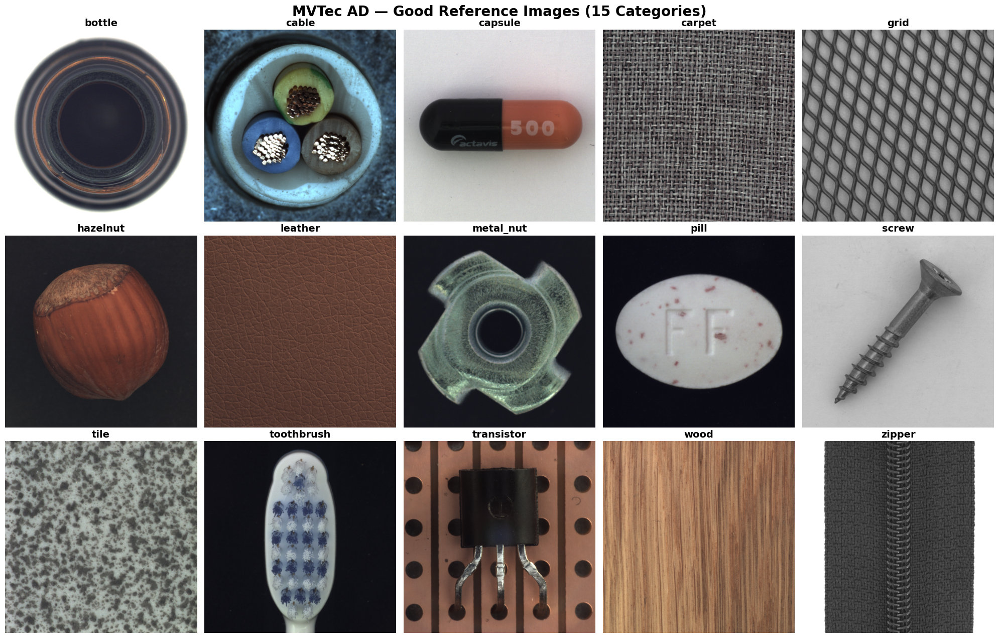

REFERENCE IMAGE INFORMATION
bottle       900x900   000.png
cable        1024x1024   000.png
capsule      1000x1000   000.png
carpet       1024x1024   000.png
grid         1024x1024   000.png
hazelnut     1024x1024   000.png
leather      1024x1024   000.png
metal_nut    700x700   000.png
pill         800x800   000.png
screw        1024x1024   000.png
tile         840x840   000.png
toothbrush   1024x1024   000.png
transistor   1024x1024   000.png
wood         1024x1024   000.png
zipper       1024x1024   000.png


In [10]:
# ============================================================
# VISUALIZE GOOD REFERENCE — ALL 15 CATEGORIES
# Before building inspection-area masks
# ============================================================

import cv2
import matplotlib.pyplot as plt
from pathlib import Path

ALL_CATEGORIES = [
    "bottle",
    "cable",
    "capsule",
    "carpet",
    "grid",
    "hazelnut",
    "leather",
    "metal_nut",
    "pill",
    "screw",
    "tile",
    "toothbrush",
    "transistor",
    "wood",
    "zipper"
]

MVTEC_PATH = Path(
    "/kaggle/input/datasets/ipythonx/mvtec-ad"
)

# ============================================================
# GET ONE GOOD REFERENCE FROM ORIGINAL TRAIN SET
# ============================================================

references = {}

for category in ALL_CATEGORIES:

    good_dir = (
        MVTEC_PATH /
        category /
        "train" /
        "good"
    )

    good_images = sorted(
        good_dir.glob("*.png")
    )

    assert len(good_images) > 0

    references[category] = good_images[0]


# ============================================================
# DISPLAY
# ============================================================

fig, axes = plt.subplots(
    3,
    5,
    figsize=(20, 13)
)

axes = axes.flatten()

for ax, category in zip(
    axes,
    ALL_CATEGORIES
):

    image_path = references[category]

    image = cv2.imread(
        str(image_path)
    )

    image_rgb = cv2.cvtColor(
        image,
        cv2.COLOR_BGR2RGB
    )

    ax.imshow(image_rgb)

    ax.set_title(
        category,
        fontsize=14,
        fontweight="bold"
    )

    ax.axis("off")


plt.suptitle(
    "MVTec AD — Good Reference Images (15 Categories)",
    fontsize=20,
    fontweight="bold"
)

plt.tight_layout()
plt.show()


# ============================================================
# PRINT IMAGE SIZES
# ============================================================

print("=" * 65)
print("REFERENCE IMAGE INFORMATION")
print("=" * 65)

for category, image_path in references.items():

    image = cv2.imread(
        str(image_path)
    )

    h, w = image.shape[:2]

    print(
        f"{category:<12} "
        f"{w}x{h}   "
        f"{image_path.name}"
    )

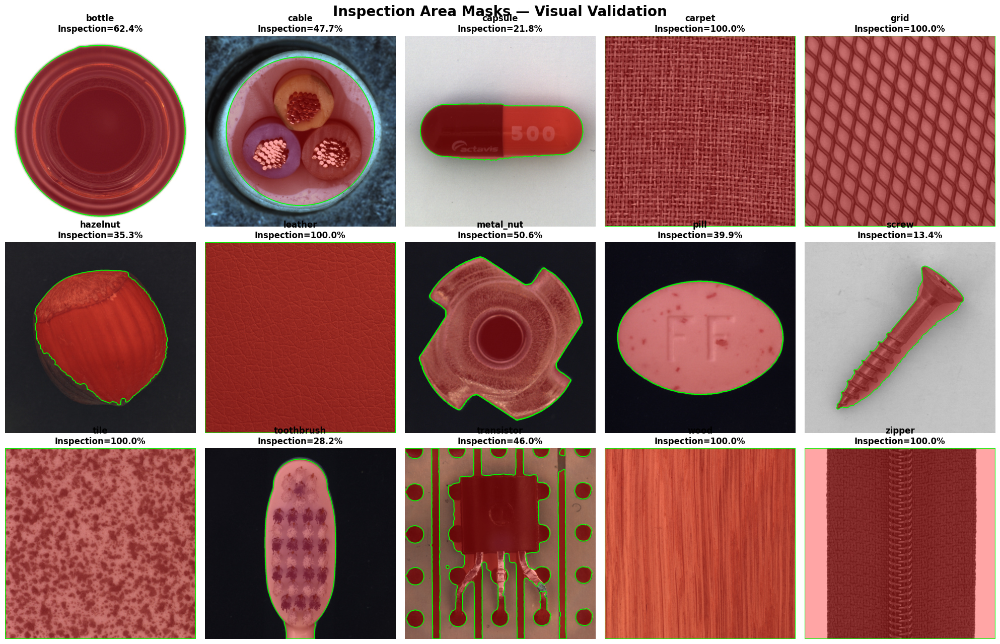

,Category,Width,Height,Inspection Pixels,Image Pixels,Inspection %
0,bottle,900,900,505598,810000,62.42
1,cable,1024,1024,500109,1048576,47.69
2,capsule,1000,1000,217834,1000000,21.78
3,carpet,1024,1024,1048576,1048576,100.00
4,grid,1024,1024,1048576,1048576,100.00
5,hazelnut,1024,1024,370203,1048576,35.31
6,leather,1024,1024,1048576,1048576,100.00
7,metal_nut,700,700,248137,490000,50.64
8,pill,800,800,255502,640000,39.92
9,screw,1024,1024,140996,1048576,13.45


In [11]:
# ============================================================
# BUILD INSPECTION MASKS — ALL 15 MVTEC CATEGORIES
# Visual validation BEFORE severity calculation
# ============================================================

import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path


MVTEC_PATH = Path(
    "/kaggle/input/datasets/ipythonx/mvtec-ad"
)

ALL_CATEGORIES = [
    "bottle",
    "cable",
    "capsule",
    "carpet",
    "grid",
    "hazelnut",
    "leather",
    "metal_nut",
    "pill",
    "screw",
    "tile",
    "toothbrush",
    "transistor",
    "wood",
    "zipper"
]


# ============================================================
# CATEGORY GROUPS
# ============================================================

FULL_SURFACE = {
    "carpet",
    "grid",
    "leather",
    "tile",
    "wood",
    "zipper"
}

OBJECT_CATEGORIES = {
    "bottle",
    "capsule",
    "hazelnut",
    "metal_nut",
    "pill",
    "screw",
    "toothbrush",
    "transistor"
}


# ============================================================
# HELPERS
# ============================================================

def largest_component(mask):
    """
    Keep largest connected foreground component.
    """

    n, labels, stats, _ = cv2.connectedComponentsWithStats(
        mask.astype(np.uint8),
        connectivity=8
    )

    if n <= 1:
        return mask.astype(np.uint8)

    largest = 1 + np.argmax(
        stats[1:, cv2.CC_STAT_AREA]
    )

    return (
        labels == largest
    ).astype(np.uint8)


def fill_external_contours(mask):
    """
    Fill object holes so inspection area represents
    the complete visible product silhouette.
    """

    contours, _ = cv2.findContours(
        (mask * 255).astype(np.uint8),
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE
    )

    filled = np.zeros_like(
        mask,
        dtype=np.uint8
    )

    cv2.drawContours(
        filled,
        contours,
        -1,
        1,
        thickness=cv2.FILLED
    )

    return filled


# ============================================================
# FOREGROUND FROM BORDER DIFFERENCE
# ============================================================

def border_foreground_mask(image):

    h, w = image.shape[:2]

    # Border samples represent background
    border_size = max(
        10,
        int(min(h, w) * 0.04)
    )

    border_pixels = np.concatenate([
        image[:border_size, :, :].reshape(-1, 3),
        image[-border_size:, :, :].reshape(-1, 3),
        image[:, :border_size, :].reshape(-1, 3),
        image[:, -border_size:, :].reshape(-1, 3)
    ])

    # Median background colour
    background = np.median(
        border_pixels,
        axis=0
    )

    image_float = image.astype(
        np.float32
    )

    background = background.astype(
        np.float32
    )

    # Colour distance from background
    distance = np.linalg.norm(
        image_float - background,
        axis=2
    )

    # Convert to uint8 for Otsu
    distance_norm = cv2.normalize(
        distance,
        None,
        0,
        255,
        cv2.NORM_MINMAX
    ).astype(np.uint8)

    _, mask = cv2.threshold(
        distance_norm,
        0,
        1,
        cv2.THRESH_BINARY + cv2.THRESH_OTSU
    )

    # Morphological cleanup
    kernel = cv2.getStructuringElement(
        cv2.MORPH_ELLIPSE,
        (11, 11)
    )

    mask = cv2.morphologyEx(
        mask,
        cv2.MORPH_CLOSE,
        kernel,
        iterations=2
    )

    mask = cv2.morphologyEx(
        mask,
        cv2.MORPH_OPEN,
        kernel,
        iterations=1
    )

    return mask.astype(
        np.uint8
    )


# ============================================================
# SPECIAL CABLE ROI
# ============================================================

def cable_inspection_mask(image):

    h, w = image.shape[:2]

    mask = np.zeros(
        (h, w),
        dtype=np.uint8
    )

    # Approximate circular inspection fixture
    center = (
        w // 2,
        h // 2
    )

    radius = int(
        min(h, w) * 0.39
    )

    cv2.circle(
        mask,
        center,
        radius,
        1,
        thickness=-1
    )

    return mask


# ============================================================
# MAIN FUNCTION
# ============================================================

def get_inspection_mask(image, category):

    h, w = image.shape[:2]

    # --------------------------------------------------------
    # Surface inspection
    # --------------------------------------------------------

    if category in FULL_SURFACE:

        return np.ones(
            (h, w),
            dtype=np.uint8
        )

    # --------------------------------------------------------
    # Cable special case
    # --------------------------------------------------------

    if category == "cable":

        return cable_inspection_mask(
            image
        )

    # --------------------------------------------------------
    # Object categories
    # --------------------------------------------------------

    if category in OBJECT_CATEGORIES:

        mask = border_foreground_mask(
            image
        )

        # For single compact objects
        if category in {
            "bottle",
            "capsule",
            "hazelnut",
            "metal_nut",
            "pill",
            "toothbrush"
        }:

            mask = largest_component(
                mask
            )

            mask = fill_external_contours(
                mask
            )

        # Screw / transistor may contain separated thin parts.
        # Do NOT force largest component.

        return mask.astype(
            np.uint8
        )

    raise ValueError(
        f"Unknown category: {category}"
    )


# ============================================================
# TEST ON GOOD REFERENCE IMAGE
# ============================================================

fig, axes = plt.subplots(
    3,
    5,
    figsize=(20, 13)
)

axes = axes.flatten()

inspection_stats = []

for ax, category in zip(
    axes,
    ALL_CATEGORIES
):

    image_path = sorted(
        (
            MVTEC_PATH /
            category /
            "train" /
            "good"
        ).glob("*.png")
    )[0]

    image = cv2.imread(
        str(image_path)
    )

    mask = get_inspection_mask(
        image,
        category
    )

    # --------------------------------------------------------
    # RED OVERLAY
    # --------------------------------------------------------

    overlay = image.copy()

    red = np.zeros_like(
        image
    )

    red[:, :, 2] = 255

    alpha = 0.35

    mask_bool = (
        mask > 0
    )

    overlay[mask_bool] = (
        (1 - alpha) *
        overlay[mask_bool] +
        alpha *
        red[mask_bool]
    ).astype(np.uint8)

    # Boundary
    contours, _ = cv2.findContours(
        (mask * 255).astype(np.uint8),
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE
    )

    cv2.drawContours(
        overlay,
        contours,
        -1,
        (0, 255, 0),
        3
    )

    overlay_rgb = cv2.cvtColor(
        overlay,
        cv2.COLOR_BGR2RGB
    )

    ax.imshow(
        overlay_rgb
    )

    coverage = (
        mask.sum() /
        mask.size *
        100
    )

    ax.set_title(
        f"{category}\nInspection={coverage:.1f}%",
        fontsize=12,
        fontweight="bold"
    )

    ax.axis("off")

    inspection_stats.append({
        "Category": category,
        "Width": image.shape[1],
        "Height": image.shape[0],
        "Inspection Pixels": int(mask.sum()),
        "Image Pixels": int(mask.size),
        "Inspection %": round(
            coverage,
            2
        )
    })


plt.suptitle(
    "Inspection Area Masks — Visual Validation",
    fontsize=20,
    fontweight="bold"
)

plt.tight_layout()
plt.show()


# ============================================================
# STATS
# ============================================================

import pandas as pd

inspection_df = pd.DataFrame(
    inspection_stats
)

display(
    inspection_df
)

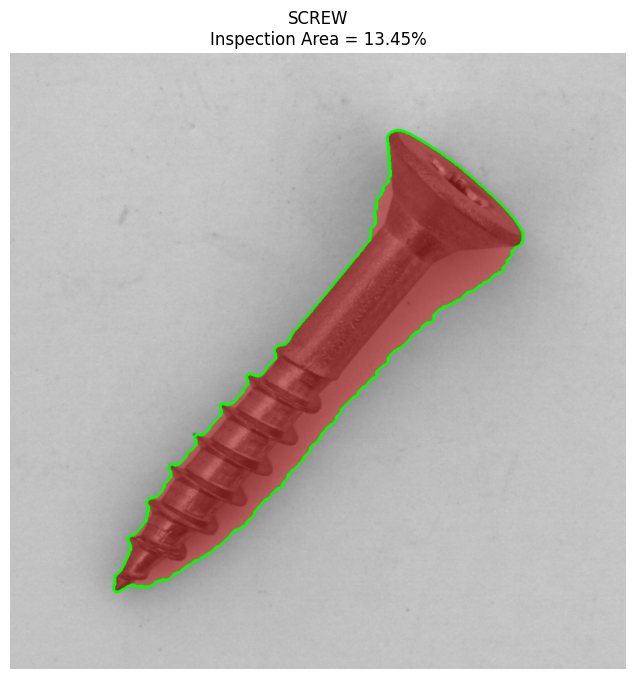

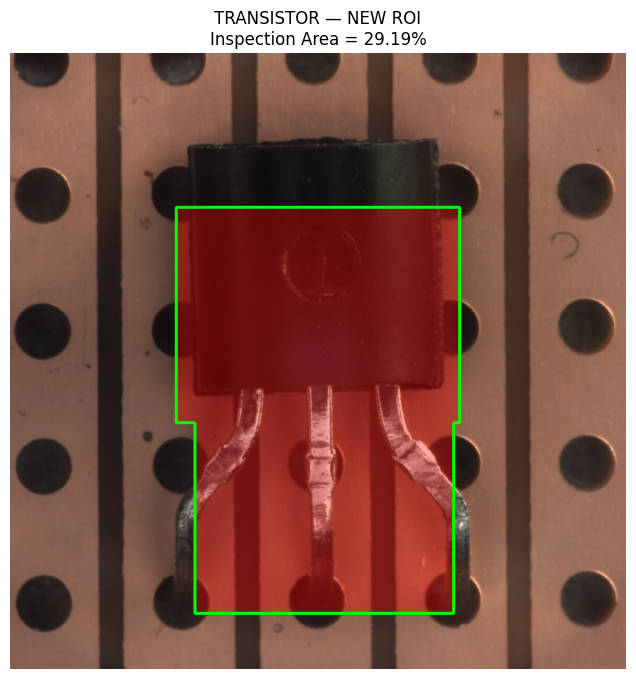

Screw inspection pixels: 140996
Screw inspection %: 13.45

Transistor inspection pixels: 306075
Transistor inspection %: 29.19


In [12]:
# ============================================================
# FIX + VALIDATE SCREW & TRANSISTOR INSPECTION MASKS
# ============================================================

import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

MVTEC_PATH = Path(
    "/kaggle/input/datasets/ipythonx/mvtec-ad"
)


# ============================================================
# TRANSISTOR FIXED INSPECTION ROI
# ============================================================

def transistor_inspection_mask(image):

    h, w = image.shape[:2]

    mask = np.zeros(
        (h, w),
        dtype=np.uint8
    )

    # --------------------------------------------------------
    # Main transistor body
    # normalized coordinates relative to image size
    # --------------------------------------------------------

    x1 = int(0.27 * w)
    x2 = int(0.73 * w)

    y1 = int(0.25 * h)
    y2 = int(0.60 * h)

    cv2.rectangle(
        mask,
        (x1, y1),
        (x2, y2),
        1,
        thickness=-1
    )

    # --------------------------------------------------------
    # Lead inspection zone
    # Includes all visible transistor leads
    # but avoids most of the fixture
    # --------------------------------------------------------

    lead_x1 = int(0.30 * w)
    lead_x2 = int(0.72 * w)

    lead_y1 = int(0.55 * h)
    lead_y2 = int(0.91 * h)

    cv2.rectangle(
        mask,
        (lead_x1, lead_y1),
        (lead_x2, lead_y2),
        1,
        thickness=-1
    )

    return mask


# ============================================================
# GET REFERENCES
# ============================================================

screw_path = sorted(
    (
        MVTEC_PATH /
        "screw" /
        "train" /
        "good"
    ).glob("*.png")
)[0]

transistor_path = sorted(
    (
        MVTEC_PATH /
        "transistor" /
        "train" /
        "good"
    ).glob("*.png")
)[0]


screw_image = cv2.imread(
    str(screw_path)
)

transistor_image = cv2.imread(
    str(transistor_path)
)


# Existing screw method
screw_mask = get_inspection_mask(
    screw_image,
    "screw"
)

# New transistor method
transistor_mask = transistor_inspection_mask(
    transistor_image
)


# ============================================================
# VISUALIZATION FUNCTION
# ============================================================

def create_overlay(image, mask):

    overlay = image.copy()

    red = np.zeros_like(image)
    red[:, :, 2] = 255

    alpha = 0.35

    idx = mask > 0

    overlay[idx] = (
        (1 - alpha) * overlay[idx] +
        alpha * red[idx]
    ).astype(np.uint8)

    contours, _ = cv2.findContours(
        (mask * 255).astype(np.uint8),
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE
    )

    cv2.drawContours(
        overlay,
        contours,
        -1,
        (0, 255, 0),
        3
    )

    return cv2.cvtColor(
        overlay,
        cv2.COLOR_BGR2RGB
    )


# ============================================================
# DISPLAY LARGE
# ============================================================

plt.figure(figsize=(8, 8))

plt.imshow(
    create_overlay(
        screw_image,
        screw_mask
    )
)

plt.title(
    f"SCREW\nInspection Area = "
    f"{screw_mask.mean()*100:.2f}%"
)

plt.axis("off")
plt.show()


plt.figure(figsize=(8, 8))

plt.imshow(
    create_overlay(
        transistor_image,
        transistor_mask
    )
)

plt.title(
    f"TRANSISTOR — NEW ROI\nInspection Area = "
    f"{transistor_mask.mean()*100:.2f}%"
)

plt.axis("off")
plt.show()


print("=" * 60)

print(
    "Screw inspection pixels:",
    int(screw_mask.sum())
)

print(
    "Screw inspection %:",
    round(
        screw_mask.mean() * 100,
        2
    )
)

print()

print(
    "Transistor inspection pixels:",
    int(transistor_mask.sum())
)

print(
    "Transistor inspection %:",
    round(
        transistor_mask.mean() * 100,
        2
    )
)

print("=" * 60)

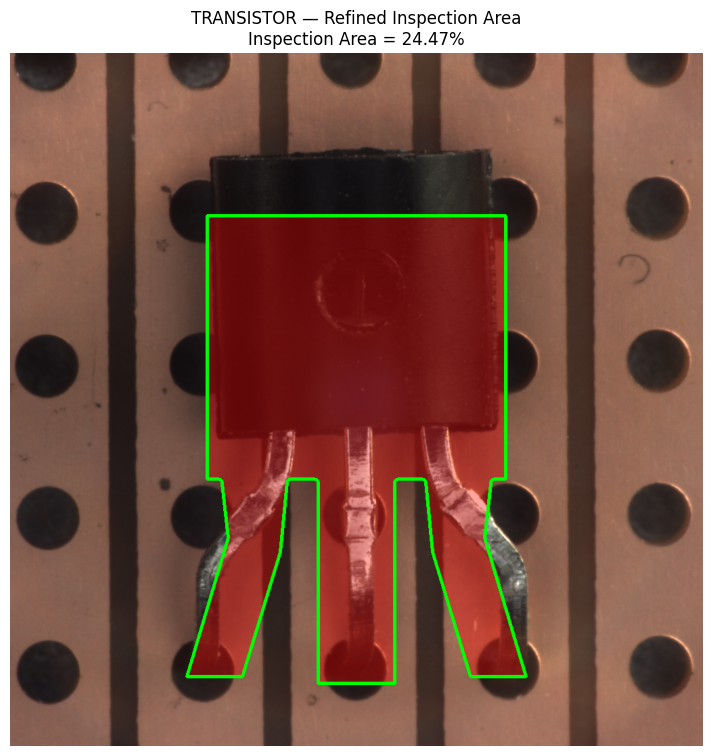

Inspection pixels: 256563
Inspection area: 24.47%


In [13]:
# ============================================================
# TRANSISTOR — REFINED INSPECTION MASK
# Body + Individual Lead Corridors
# ============================================================

import cv2
import numpy as np
import matplotlib.pyplot as plt


def transistor_inspection_mask(image):

    h, w = image.shape[:2]

    mask = np.zeros(
        (h, w),
        dtype=np.uint8
    )

    # ========================================================
    # 1. MAIN BODY
    # Slight margin around the transistor case
    # ========================================================

    body_x1 = int(0.285 * w)
    body_x2 = int(0.715 * w)

    body_y1 = int(0.235 * h)
    body_y2 = int(0.615 * h)

    cv2.rectangle(
        mask,
        (body_x1, body_y1),
        (body_x2, body_y2),
        1,
        -1
    )


    # ========================================================
    # 2. LEFT LEAD CORRIDOR
    # Wide enough for bent-lead defects
    # ========================================================

    pts_left = np.array([
        [int(0.300*w), int(0.570*h)],
        [int(0.405*w), int(0.570*h)],
        [int(0.390*w), int(0.720*h)],
        [int(0.335*w), int(0.900*h)],
        [int(0.255*w), int(0.900*h)],
        [int(0.315*w), int(0.700*h)]
    ], dtype=np.int32)

    cv2.fillPoly(
        mask,
        [pts_left],
        1
    )


    # ========================================================
    # 3. CENTER LEAD CORRIDOR
    # ========================================================

    pts_center = np.array([
        [int(0.445*w), int(0.570*h)],
        [int(0.555*w), int(0.570*h)],
        [int(0.555*w), int(0.910*h)],
        [int(0.445*w), int(0.910*h)]
    ], dtype=np.int32)

    cv2.fillPoly(
        mask,
        [pts_center],
        1
    )


    # ========================================================
    # 4. RIGHT LEAD CORRIDOR
    # ========================================================

    pts_right = np.array([
        [int(0.595*w), int(0.570*h)],
        [int(0.700*w), int(0.570*h)],
        [int(0.685*w), int(0.700*h)],
        [int(0.745*w), int(0.900*h)],
        [int(0.665*w), int(0.900*h)],
        [int(0.610*w), int(0.720*h)]
    ], dtype=np.int32)

    cv2.fillPoly(
        mask,
        [pts_right],
        1
    )


    # ========================================================
    # 5. SMALL SMOOTHING
    # ========================================================

    kernel = cv2.getStructuringElement(
        cv2.MORPH_ELLIPSE,
        (9, 9)
    )

    mask = cv2.morphologyEx(
        mask,
        cv2.MORPH_CLOSE,
        kernel
    )

    return mask


# ============================================================
# TEST
# ============================================================

transistor_mask_new = transistor_inspection_mask(
    transistor_image
)

overlay = create_overlay(
    transistor_image,
    transistor_mask_new
)

plt.figure(
    figsize=(9, 9)
)

plt.imshow(
    overlay
)

plt.title(
    "TRANSISTOR — Refined Inspection Area\n"
    f"Inspection Area = "
    f"{transistor_mask_new.mean()*100:.2f}%"
)

plt.axis("off")
plt.show()


print("=" * 60)

print(
    "Inspection pixels:",
    int(transistor_mask_new.sum())
)

print(
    "Inspection area:",
    f"{transistor_mask_new.mean()*100:.2f}%"
)

print("=" * 60)

In [14]:
# ============================================================
# FINAL DEFECT COVERAGE + SEVERITY SYSTEM
# ALL 15 CATEGORIES — TEST SET
# ============================================================

import cv2
import numpy as np
import pandas as pd
from pathlib import Path
from ultralytics import YOLO


# ============================================================
# CONFIG
# ============================================================

TEST_IMAGES = Path(
    "/kaggle/working/mvtec_yolo_seg_15cat/images/test"
)

TEST_LABELS = Path(
    "/kaggle/working/mvtec_yolo_seg_15cat/labels/test"
)

BEST_MODEL = Path(
    "/kaggle/working/runs/"
    "industrial_defect_15cat_yolov8s_seg/"
    "weights/best.pt"
)

CONF_THRESHOLD = 0.05

SEVERITY_THRESHOLD = 5.0


ALL_CATEGORIES = [
    "bottle",
    "cable",
    "capsule",
    "carpet",
    "grid",
    "hazelnut",
    "leather",
    "metal_nut",
    "pill",
    "screw",
    "tile",
    "toothbrush",
    "transistor",
    "wood",
    "zipper"
]


FULL_SURFACE = {
    "carpet",
    "grid",
    "leather",
    "tile",
    "wood",
    "zipper"
}


# ============================================================
# CATEGORY FROM FILENAME
# ============================================================

def get_category(filename):

    for category in sorted(
        ALL_CATEGORIES,
        key=len,
        reverse=True
    ):

        if filename.startswith(
            category + "_"
        ):
            return category

    return "unknown"


# ============================================================
# MASK HELPERS
# ============================================================

def largest_component(mask):

    n, labels, stats, _ = (
        cv2.connectedComponentsWithStats(
            mask.astype(np.uint8),
            connectivity=8
        )
    )

    if n <= 1:
        return mask.astype(np.uint8)

    largest = (
        1 +
        np.argmax(
            stats[1:, cv2.CC_STAT_AREA]
        )
    )

    return (
        labels == largest
    ).astype(np.uint8)


def fill_external_contours(mask):

    contours, _ = cv2.findContours(
        (mask * 255).astype(np.uint8),
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE
    )

    filled = np.zeros_like(
        mask,
        dtype=np.uint8
    )

    cv2.drawContours(
        filled,
        contours,
        -1,
        1,
        thickness=cv2.FILLED
    )

    return filled


def border_foreground_mask(image):

    h, w = image.shape[:2]

    border_size = max(
        10,
        int(min(h, w) * 0.04)
    )

    border_pixels = np.concatenate([
        image[:border_size, :, :].reshape(-1, 3),
        image[-border_size:, :, :].reshape(-1, 3),
        image[:, :border_size, :].reshape(-1, 3),
        image[:, -border_size:, :].reshape(-1, 3)
    ])

    background = np.median(
        border_pixels,
        axis=0
    ).astype(np.float32)

    image_float = image.astype(
        np.float32
    )

    distance = np.linalg.norm(
        image_float - background,
        axis=2
    )

    distance_norm = cv2.normalize(
        distance,
        None,
        0,
        255,
        cv2.NORM_MINMAX
    ).astype(np.uint8)

    _, mask = cv2.threshold(
        distance_norm,
        0,
        1,
        cv2.THRESH_BINARY +
        cv2.THRESH_OTSU
    )

    kernel = cv2.getStructuringElement(
        cv2.MORPH_ELLIPSE,
        (11, 11)
    )

    mask = cv2.morphologyEx(
        mask,
        cv2.MORPH_CLOSE,
        kernel,
        iterations=2
    )

    mask = cv2.morphologyEx(
        mask,
        cv2.MORPH_OPEN,
        kernel,
        iterations=1
    )

    return mask.astype(
        np.uint8
    )


# ============================================================
# CABLE
# ============================================================

def cable_inspection_mask(image):

    h, w = image.shape[:2]

    mask = np.zeros(
        (h, w),
        dtype=np.uint8
    )

    cv2.circle(
        mask,
        (w // 2, h // 2),
        int(min(h, w) * 0.39),
        1,
        -1
    )

    return mask


# ============================================================
# TRANSISTOR — FINAL REFINED ROI
# ============================================================

def transistor_inspection_mask(image):

    h, w = image.shape[:2]

    mask = np.zeros(
        (h, w),
        dtype=np.uint8
    )

    # Main body
    cv2.rectangle(
        mask,
        (
            int(0.285 * w),
            int(0.235 * h)
        ),
        (
            int(0.715 * w),
            int(0.615 * h)
        ),
        1,
        -1
    )

    # Left lead
    pts_left = np.array([
        [int(0.300*w), int(0.570*h)],
        [int(0.405*w), int(0.570*h)],
        [int(0.390*w), int(0.720*h)],
        [int(0.335*w), int(0.900*h)],
        [int(0.255*w), int(0.900*h)],
        [int(0.315*w), int(0.700*h)]
    ], dtype=np.int32)

    cv2.fillPoly(
        mask,
        [pts_left],
        1
    )

    # Center lead
    pts_center = np.array([
        [int(0.445*w), int(0.570*h)],
        [int(0.555*w), int(0.570*h)],
        [int(0.555*w), int(0.910*h)],
        [int(0.445*w), int(0.910*h)]
    ], dtype=np.int32)

    cv2.fillPoly(
        mask,
        [pts_center],
        1
    )

    # Right lead
    pts_right = np.array([
        [int(0.595*w), int(0.570*h)],
        [int(0.700*w), int(0.570*h)],
        [int(0.685*w), int(0.700*h)],
        [int(0.745*w), int(0.900*h)],
        [int(0.665*w), int(0.900*h)],
        [int(0.610*w), int(0.720*h)]
    ], dtype=np.int32)

    cv2.fillPoly(
        mask,
        [pts_right],
        1
    )

    kernel = cv2.getStructuringElement(
        cv2.MORPH_ELLIPSE,
        (9, 9)
    )

    mask = cv2.morphologyEx(
        mask,
        cv2.MORPH_CLOSE,
        kernel
    )

    return mask


# ============================================================
# FINAL INSPECTION MASK FUNCTION
# ============================================================

def get_inspection_mask_final(
    image,
    category
):

    h, w = image.shape[:2]

    # Surface categories
    if category in FULL_SURFACE:

        return np.ones(
            (h, w),
            dtype=np.uint8
        )

    # Cable
    if category == "cable":

        return cable_inspection_mask(
            image
        )

    # Transistor
    if category == "transistor":

        return transistor_inspection_mask(
            image
        )

    # Remaining object categories
    if category in {
        "bottle",
        "capsule",
        "hazelnut",
        "metal_nut",
        "pill",
        "toothbrush"
    }:

        mask = border_foreground_mask(
            image
        )

        mask = largest_component(
            mask
        )

        mask = fill_external_contours(
            mask
        )

        return mask

    # Screw
    if category == "screw":

        return border_foreground_mask(
            image
        )

    raise ValueError(
        f"Unknown category: {category}"
    )


# ============================================================
# LOAD MODEL
# ============================================================

model_final = YOLO(
    str(BEST_MODEL)
)


# ============================================================
# PREDICT ALL TEST IMAGES
# ============================================================

print("=" * 75)
print("RUNNING FINAL INDUSTRIAL INSPECTION")
print("=" * 75)

predictions = model_final.predict(
    source=str(TEST_IMAGES),
    imgsz=640,
    conf=CONF_THRESHOLD,
    device=0,
    batch=16,
    retina_masks=True,
    verbose=False
)


# ============================================================
# PROCESS RESULTS
# ============================================================

report_rows = []

for result in predictions:

    image_path = Path(
        result.path
    )

    image = cv2.imread(
        str(image_path)
    )

    h, w = image.shape[:2]

    category = get_category(
        image_path.name
    )

    # --------------------------------------------------------
    # Ground truth
    # --------------------------------------------------------

    label_path = (
        TEST_LABELS /
        f"{image_path.stem}.txt"
    )

    gt_defective = bool(
        label_path
        .read_text()
        .strip()
    )

    # --------------------------------------------------------
    # Inspection Area
    # --------------------------------------------------------

    inspection_mask = (
        get_inspection_mask_final(
            image,
            category
        )
    )

    inspection_mask = (
        inspection_mask > 0
    )

    inspection_pixels = int(
        inspection_mask.sum()
    )

    # --------------------------------------------------------
    # YOLO Defect Mask
    # --------------------------------------------------------

    combined_defect_mask = np.zeros(
        (h, w),
        dtype=bool
    )

    detections = len(
        result.boxes
    )

    max_conf = 0.0

    if detections > 0:

        max_conf = float(
            result.boxes.conf
            .max()
            .cpu()
        )

        if result.masks is not None:

            masks = (
                result.masks.data
                .cpu()
                .numpy()
            )

            for mask in masks:

                # Safety resize
                if mask.shape != (h, w):

                    mask = cv2.resize(
                        mask,
                        (w, h),
                        interpolation=cv2.INTER_NEAREST
                    )

                combined_defect_mask |= (
                    mask > 0.5
                )

    # --------------------------------------------------------
    # Defect INSIDE inspection region
    # --------------------------------------------------------

    defect_inside = (
        combined_defect_mask &
        inspection_mask
    )

    defect_pixels = int(
        defect_inside.sum()
    )

    # --------------------------------------------------------
    # Coverage
    # --------------------------------------------------------

    if inspection_pixels > 0:

        coverage = (
            defect_pixels /
            inspection_pixels *
            100
        )

    else:

        coverage = 0.0

    # --------------------------------------------------------
    # FINAL QC LOGIC
    #
    # Detection controls PASS / REJECT.
    # Coverage controls severity only.
    # --------------------------------------------------------

    defect_detected = (
        detections > 0
    )

    if not defect_detected:

        decision = "PASS"
        severity = "None"

    elif coverage < SEVERITY_THRESHOLD:

        decision = "REJECT"
        severity = "Minor"

    else:

        decision = "REJECT"
        severity = "Severe"

    # --------------------------------------------------------
    # Correct image-level decision?
    # --------------------------------------------------------

    expected_decision = (
        "REJECT"
        if gt_defective
        else "PASS"
    )

    correct = (
        decision ==
        expected_decision
    )

    # --------------------------------------------------------
    # SAVE REPORT ROW
    # --------------------------------------------------------

    report_rows.append({

        "Image":
            image_path.name,

        "Category":
            category,

        "Ground Truth":
            "Defective"
            if gt_defective
            else "Good",

        "Detections":
            detections,

        "Max Confidence":
            round(
                max_conf,
                4
            ),

        "Inspection Pixels":
            inspection_pixels,

        "Defect Pixels":
            defect_pixels,

        "Defect Coverage (%)":
            round(
                coverage,
                4
            ),

        "Severity":
            severity,

        "Decision":
            decision,

        "Correct":
            correct
    })


# ============================================================
# DATAFRAME
# ============================================================

final_report = pd.DataFrame(
    report_rows
)


# ============================================================
# SAVE CSV
# ============================================================

REPORT_PATH = Path(
    "/kaggle/working/"
    "final_industrial_inspection_report.csv"
)

final_report.to_csv(
    REPORT_PATH,
    index=False
)


# ============================================================
# SUMMARY
# ============================================================

print("\n" + "=" * 75)
print("FINAL INSPECTION SUMMARY")
print("=" * 75)

print(
    "\nTotal images:",
    len(final_report)
)

print(
    "\nDecisions:"
)

print(
    final_report[
        "Decision"
    ].value_counts()
)

print(
    "\nSeverity:"
)

print(
    final_report[
        "Severity"
    ].value_counts()
)

print(
    "\nCorrect decisions:",
    int(
        final_report[
            "Correct"
        ].sum()
    )
)

print(
    "Incorrect decisions:",
    int(
        (~final_report[
            "Correct"
        ]).sum()
    )
)


# ============================================================
# DEFECTIVE IMAGES ONLY
# ============================================================

defective_report = final_report[
    final_report[
        "Ground Truth"
    ] == "Defective"
]

print("\n" + "=" * 75)
print("KNOWN DEFECTIVE PRODUCTS")
print("=" * 75)

print(
    "\nSeverity distribution:"
)

print(
    defective_report[
        "Severity"
    ].value_counts()
)


# ============================================================
# PER CATEGORY
# ============================================================

category_summary = (
    final_report
    .groupby("Category")
    .agg(
        Images=("Image", "count"),

        Mean_Coverage=(
            "Defect Coverage (%)",
            "mean"
        ),

        Max_Coverage=(
            "Defect Coverage (%)",
            "max"
        ),

        Minor=(
            "Severity",
            lambda x:
            (x == "Minor").sum()
        ),

        Severe=(
            "Severity",
            lambda x:
            (x == "Severe").sum()
        ),

        Pass=(
            "Decision",
            lambda x:
            (x == "PASS").sum()
        ),

        Reject=(
            "Decision",
            lambda x:
            (x == "REJECT").sum()
        )
    )
    .reset_index()
)

category_summary[
    "Mean_Coverage"
] = category_summary[
    "Mean_Coverage"
].round(2)

category_summary[
    "Max_Coverage"
] = category_summary[
    "Max_Coverage"
].round(2)


print("\n" + "=" * 75)
print("PER-CATEGORY INSPECTION SUMMARY")
print("=" * 75)

display(
    category_summary
)


# ============================================================
# HIGHEST COVERAGE DEFECTS
# ============================================================

print("\n" + "=" * 75)
print("TOP 20 HIGHEST DEFECT COVERAGE")
print("=" * 75)

display(
    final_report
    .sort_values(
        "Defect Coverage (%)",
        ascending=False
    )
    .head(20)[
        [
            "Image",
            "Category",
            "Ground Truth",
            "Max Confidence",
            "Defect Coverage (%)",
            "Severity",
            "Decision"
        ]
    ]
)


print("\nReport saved to:")
print(REPORT_PATH)

print("\n" + "=" * 75)
print("FINAL COVERAGE ANALYSIS COMPLETE")
print("=" * 75)

RUNNING FINAL INDUSTRIAL INSPECTION

FINAL INSPECTION SUMMARY

Total images: 378

Decisions:
Decision
REJECT    194
PASS      184
Name: count, dtype: int64

Severity:
Severity
None      184
Minor     141
Severe     53
Name: count, dtype: int64

Correct decisions: 357
Incorrect decisions: 21

KNOWN DEFECTIVE PRODUCTS

Severity distribution:
Severity
Minor     129
Severe     52
None        8
Name: count, dtype: int64

PER-CATEGORY INSPECTION SUMMARY


,Category,Images,Mean_Coverage,Max_Coverage,Minor,Severe,Pass,Reject
0,bottle,23,3.55,22.20,4,6,13,10
1,cable,27,5.41,30.06,2,11,14,13
2,capsule,29,2.07,36.31,15,1,13,16
3,carpet,26,1.13,6.01,11,2,13,13
4,grid,21,0.42,2.23,8,0,13,8
5,hazelnut,22,6.02,86.61,7,3,12,10
6,leather,27,0.56,4.09,14,0,13,14
7,metal_nut,29,16.12,99.89,6,10,13,16
8,pill,34,5.04,99.34,16,5,13,21
9,screw,30,1.07,4.68,17,0,13,17



TOP 20 HIGHEST DEFECT COVERAGE


,Image,Category,Ground Truth,Max Confidence,Defect Coverage (%),Severity,Decision
185,metal_nut_flip_008.png,metal_nut,Defective,0.7886,99.8916,Severe,REJECT
234,pill_pill_type_004.png,pill,Defective,0.8330,99.3447,Severe,REJECT
186,metal_nut_flip_013.png,metal_nut,Defective,0.7004,99.1410,Severe,REJECT
184,metal_nut_flip_007.png,metal_nut,Defective,0.4935,99.0073,Severe,REJECT
183,metal_nut_flip_005.png,metal_nut,Defective,0.5723,96.4082,Severe,REJECT
325,transistor_misplaced_005.png,transistor,Defective,0.4703,89.9779,Severe,REJECT
127,hazelnut_crack_009.png,hazelnut,Defective,0.8962,86.6095,Severe,REJECT
326,transistor_misplaced_006.png,transistor,Defective,0.3743,79.5341,Severe,REJECT
76,capsule_squeeze_006.png,capsule,Defective,0.8712,36.3052,Severe,REJECT
316,transistor_good_064.png,transistor,Good,0.0596,32.7179,Severe,REJECT



Report saved to:
/kaggle/working/final_industrial_inspection_report.csv

FINAL COVERAGE ANALYSIS COMPLETE


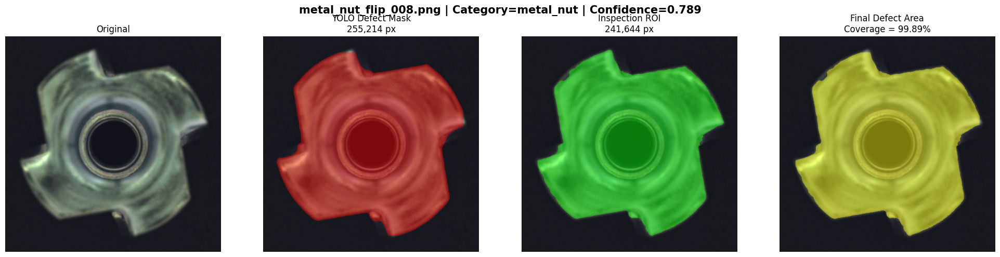

metal_nut_flip_008.png
Inspection pixels : 241,644
YOLO mask pixels  : 255,214
Final defect px   : 241,382
Coverage          : 99.89%


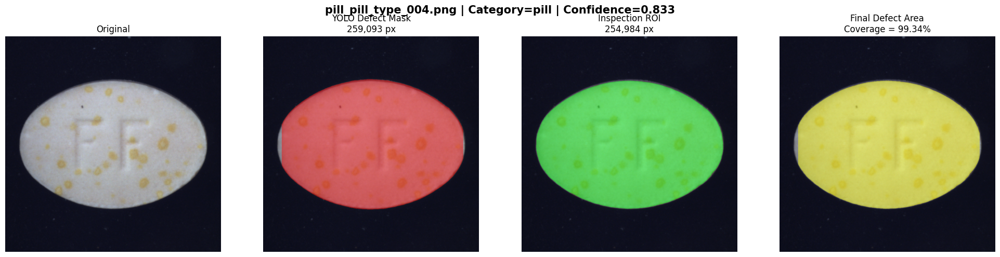

pill_pill_type_004.png
Inspection pixels : 254,984
YOLO mask pixels  : 259,093
Final defect px   : 253,313
Coverage          : 99.34%


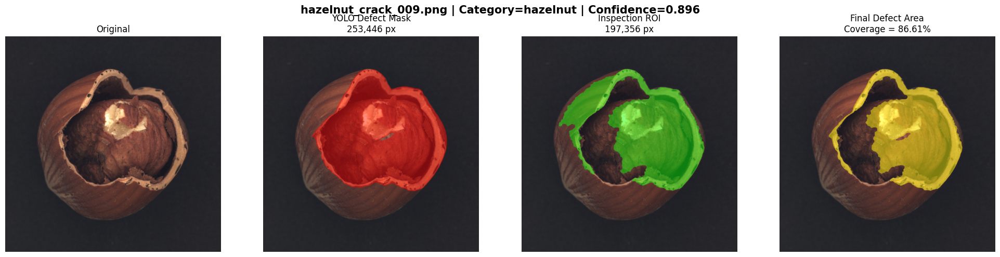

hazelnut_crack_009.png
Inspection pixels : 197,356
YOLO mask pixels  : 253,446
Final defect px   : 170,929
Coverage          : 86.61%


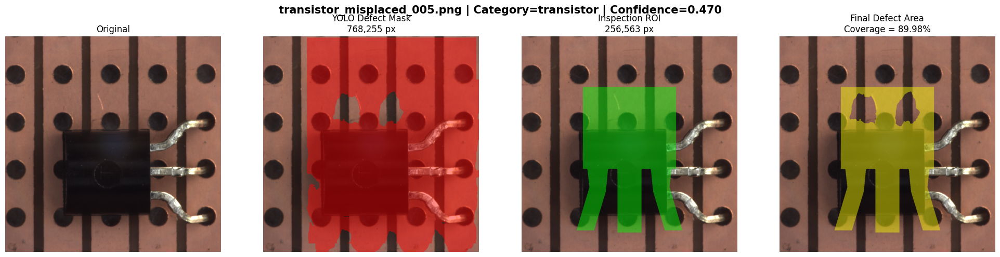

transistor_misplaced_005.png
Inspection pixels : 256,563
YOLO mask pixels  : 768,255
Final defect px   : 230,850
Coverage          : 89.98%


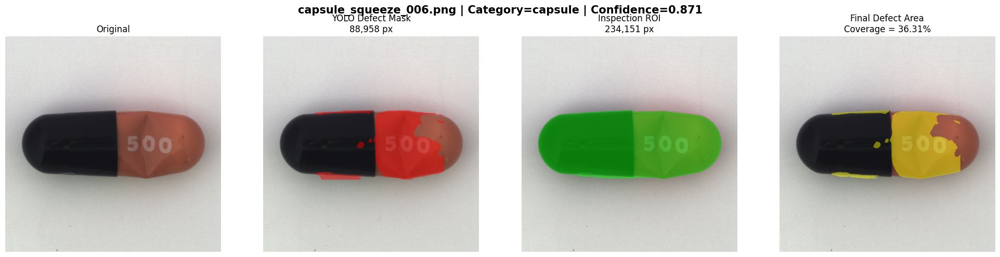

capsule_squeeze_006.png
Inspection pixels : 234,151
YOLO mask pixels  : 88,958
Final defect px   : 85,009
Coverage          : 36.31%


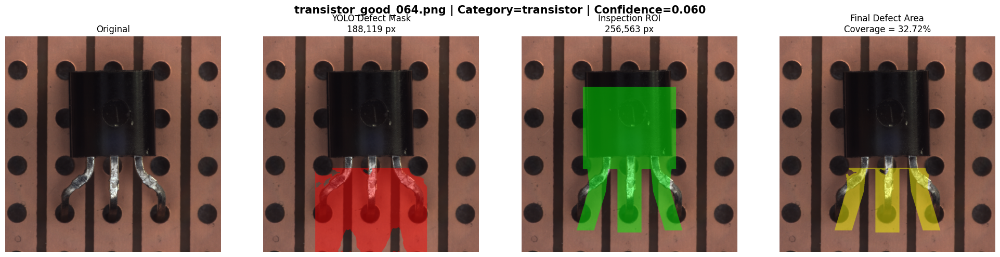

transistor_good_064.png
Inspection pixels : 256,563
YOLO mask pixels  : 188,119
Final defect px   : 83,942
Coverage          : 32.72%


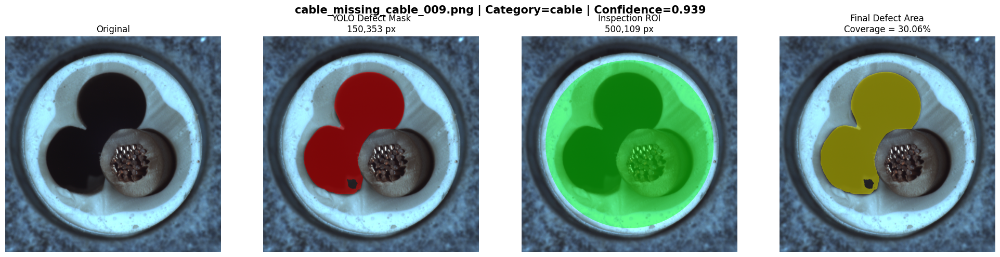

cable_missing_cable_009.png
Inspection pixels : 500,109
YOLO mask pixels  : 150,353
Final defect px   : 150,353
Coverage          : 30.06%


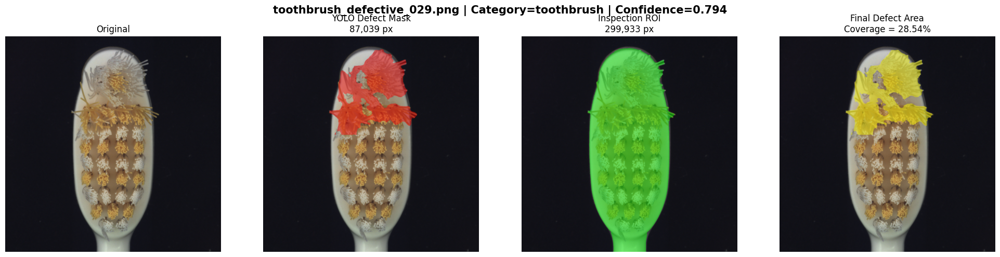

toothbrush_defective_029.png
Inspection pixels : 299,933
YOLO mask pixels  : 87,039
Final defect px   : 85,610
Coverage          : 28.54%


In [15]:
# ============================================================
# VISUAL AUDIT — HIGHEST DEFECT COVERAGE CASES
# Original | YOLO Mask | Inspection ROI | Final Intersection
# ============================================================

import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# Cases we specifically want to audit
AUDIT_IMAGES = [
    "metal_nut_flip_008.png",
    "pill_pill_type_004.png",
    "hazelnut_crack_009.png",
    "transistor_misplaced_005.png",
    "capsule_squeeze_006.png",
    "transistor_good_064.png",
    "cable_missing_cable_009.png",
    "toothbrush_defective_029.png"
]

# Map predictions by filename
prediction_map = {
    Path(r.path).name: r
    for r in predictions
}


def build_yolo_mask(result, h, w):

    combined = np.zeros(
        (h, w),
        dtype=bool
    )

    if result.masks is None:
        return combined

    masks = (
        result.masks.data
        .cpu()
        .numpy()
    )

    for mask in masks:

        if mask.shape != (h, w):

            mask = cv2.resize(
                mask,
                (w, h),
                interpolation=cv2.INTER_NEAREST
            )

        combined |= (
            mask > 0.5
        )

    return combined


def mask_overlay(
    image,
    mask,
    channel="red"
):

    rgb = cv2.cvtColor(
        image,
        cv2.COLOR_BGR2RGB
    )

    overlay = rgb.copy()

    mask = mask.astype(bool)

    if channel == "red":
        target = np.array(
            [255, 0, 0],
            dtype=np.float32
        )

    elif channel == "green":
        target = np.array(
            [0, 255, 0],
            dtype=np.float32
        )

    else:
        target = np.array(
            [255, 255, 0],
            dtype=np.float32
        )

    overlay[mask] = (
        0.55 *
        overlay[mask].astype(np.float32)
        +
        0.45 *
        target
    ).astype(np.uint8)

    return overlay


# ============================================================
# DISPLAY EACH CASE
# ============================================================

for filename in AUDIT_IMAGES:

    result = prediction_map.get(
        filename
    )

    if result is None:
        print(
            "Prediction not found:",
            filename
        )
        continue

    image_path = Path(
        result.path
    )

    image = cv2.imread(
        str(image_path)
    )

    h, w = image.shape[:2]

    category = get_category(
        filename
    )

    inspection_mask = (
        get_inspection_mask_final(
            image,
            category
        ) > 0
    )

    yolo_mask = build_yolo_mask(
        result,
        h,
        w
    )

    final_mask = (
        yolo_mask &
        inspection_mask
    )

    inspection_pixels = int(
        inspection_mask.sum()
    )

    yolo_pixels = int(
        yolo_mask.sum()
    )

    final_pixels = int(
        final_mask.sum()
    )

    coverage = (
        final_pixels /
        inspection_pixels *
        100
        if inspection_pixels
        else 0
    )

    max_conf = (
        float(
            result.boxes.conf
            .max()
            .cpu()
        )
        if len(result.boxes)
        else 0
    )

    # --------------------------------------------------------
    # Plot
    # --------------------------------------------------------

    fig, axes = plt.subplots(
        1,
        4,
        figsize=(20, 5)
    )

    axes[0].imshow(
        cv2.cvtColor(
            image,
            cv2.COLOR_BGR2RGB
        )
    )

    axes[0].set_title(
        "Original"
    )

    axes[1].imshow(
        mask_overlay(
            image,
            yolo_mask,
            "red"
        )
    )

    axes[1].set_title(
        f"YOLO Defect Mask\n"
        f"{yolo_pixels:,} px"
    )

    axes[2].imshow(
        mask_overlay(
            image,
            inspection_mask,
            "green"
        )
    )

    axes[2].set_title(
        f"Inspection ROI\n"
        f"{inspection_pixels:,} px"
    )

    axes[3].imshow(
        mask_overlay(
            image,
            final_mask,
            "yellow"
        )
    )

    axes[3].set_title(
        f"Final Defect Area\n"
        f"Coverage = {coverage:.2f}%"
    )

    for ax in axes:
        ax.axis("off")

    plt.suptitle(
        f"{filename} | "
        f"Category={category} | "
        f"Confidence={max_conf:.3f}",
        fontsize=15,
        fontweight="bold"
    )

    plt.tight_layout()
    plt.show()

    print(
        f"{filename}\n"
        f"Inspection pixels : {inspection_pixels:,}\n"
        f"YOLO mask pixels  : {yolo_pixels:,}\n"
        f"Final defect px   : {final_pixels:,}\n"
        f"Coverage          : {coverage:.2f}%\n"
        + "=" * 70
    )

In [16]:
# ============================================================
# COVERAGE VALIDATION
# Predicted Coverage VS Ground-Truth Coverage
# 189 DEFECTIVE TEST IMAGES
# ============================================================

import cv2
import numpy as np
import pandas as pd
from pathlib import Path


MVTEC_PATH = Path(
    "/kaggle/input/datasets/ipythonx/mvtec-ad"
)

# ============================================================
# DEFECT TYPE FROM OUR RENAMED FILENAME
# We will match using the original image stem.
# ============================================================

def find_original_gt_mask(
    category,
    converted_filename
):

    stem = Path(
        converted_filename
    ).stem

    prefix = category + "_"

    rest = stem[len(prefix):]

    # Search all defect folders for matching original stem.
    # Filename format:
    # category_defect_type_originalstem
    #
    # This avoids problems with defect types containing "_".

    gt_root = (
        MVTEC_PATH /
        category /
        "ground_truth"
    )

    if not gt_root.exists():
        return []

    matches = []

    for defect_dir in gt_root.iterdir():

        if not defect_dir.is_dir():
            continue

        defect_type = defect_dir.name

        expected_prefix = (
            defect_type + "_"
        )

        if not rest.startswith(
            expected_prefix
        ):
            continue

        original_stem = rest[
            len(expected_prefix):
        ]

        # MVTec masks normally:
        # 000_mask.png

        candidates = list(
            defect_dir.glob(
                f"{original_stem}_mask.png"
            )
        )

        # Safety fallback
        if not candidates:

            candidates = list(
                defect_dir.glob(
                    f"{original_stem}*.png"
                )
            )

        matches.extend(
            candidates
        )

    return matches


# ============================================================
# MAP PREDICTIONS
# ============================================================

prediction_map = {
    Path(r.path).name: r
    for r in predictions
}


# ============================================================
# PROCESS DEFECTIVE TEST IMAGES
# ============================================================

coverage_validation_rows = []

defective_rows = final_report[
    final_report["Ground Truth"]
    == "Defective"
]


for _, row in defective_rows.iterrows():

    filename = row["Image"]

    category = row["Category"]

    result = prediction_map[
        filename
    ]

    image = cv2.imread(
        result.path
    )

    h, w = image.shape[:2]

    # --------------------------------------------------------
    # Inspection ROI
    # --------------------------------------------------------

    inspection_mask = (
        get_inspection_mask_final(
            image,
            category
        ) > 0
    )

    inspection_pixels = int(
        inspection_mask.sum()
    )

    # --------------------------------------------------------
    # PREDICTED COVERAGE
    # already calculated
    # --------------------------------------------------------

    predicted_coverage = float(
        row["Defect Coverage (%)"]
    )

    # --------------------------------------------------------
    # FIND GT MASK
    # --------------------------------------------------------

    gt_paths = find_original_gt_mask(
        category,
        filename
    )

    if len(gt_paths) == 0:

        print(
            "GT NOT FOUND:",
            filename
        )

        continue

    # Combine GT masks if necessary
    gt_combined = np.zeros(
        (h, w),
        dtype=bool
    )

    for gt_path in gt_paths:

        gt = cv2.imread(
            str(gt_path),
            cv2.IMREAD_GRAYSCALE
        )

        if gt is None:
            continue

        if gt.shape != (h, w):

            gt = cv2.resize(
                gt,
                (w, h),
                interpolation=cv2.INTER_NEAREST
            )

        gt_combined |= (
            gt > 127
        )

    # --------------------------------------------------------
    # GT DEFECT INSIDE INSPECTION AREA
    # --------------------------------------------------------

    gt_inside = (
        gt_combined &
        inspection_mask
    )

    gt_defect_pixels = int(
        gt_inside.sum()
    )

    gt_coverage = (
        gt_defect_pixels /
        inspection_pixels *
        100
        if inspection_pixels
        else 0
    )

    # --------------------------------------------------------
    # ERROR
    # --------------------------------------------------------

    abs_error = abs(
        predicted_coverage -
        gt_coverage
    )

    coverage_validation_rows.append({

        "Image":
            filename,

        "Category":
            category,

        "Predicted Coverage (%)":
            round(
                predicted_coverage,
                4
            ),

        "GT Coverage (%)":
            round(
                gt_coverage,
                4
            ),

        "Absolute Error (%)":
            round(
                abs_error,
                4
            ),

        "Detected":
            row["Decision"]
            == "REJECT",

        "Confidence":
            row["Max Confidence"]
    })


# ============================================================
# DATAFRAME
# ============================================================

coverage_validation = pd.DataFrame(
    coverage_validation_rows
)


print("=" * 85)
print("DEFECT COVERAGE VALIDATION")
print("=" * 85)

print(
    "\nMatched defective images:",
    len(coverage_validation),
    "/",
    len(defective_rows)
)


# ============================================================
# GLOBAL ERROR
# ============================================================

mae = (
    coverage_validation[
        "Absolute Error (%)"
    ].mean()
)

median_error = (
    coverage_validation[
        "Absolute Error (%)"
    ].median()
)

print(
    f"\nCoverage MAE       : "
    f"{mae:.2f} percentage points"
)

print(
    f"Median Abs. Error : "
    f"{median_error:.2f} percentage points"
)


# ============================================================
# PER CATEGORY
# ============================================================

category_coverage_validation = (
    coverage_validation
    .groupby("Category")
    .agg(

        Samples=(
            "Image",
            "count"
        ),

        Predicted_Mean=(
            "Predicted Coverage (%)",
            "mean"
        ),

        GT_Mean=(
            "GT Coverage (%)",
            "mean"
        ),

        MAE=(
            "Absolute Error (%)",
            "mean"
        ),

        Median_Error=(
            "Absolute Error (%)",
            "median"
        )
    )
    .reset_index()
)


for col in [
    "Predicted_Mean",
    "GT_Mean",
    "MAE",
    "Median_Error"
]:

    category_coverage_validation[
        col
    ] = (
        category_coverage_validation[
            col
        ].round(2)
    )


print(
    "\n" +
    "=" * 85
)

print(
    "PER-CATEGORY COVERAGE VALIDATION"
)

print(
    "=" * 85
)

display(
    category_coverage_validation
)


# ============================================================
# WORST COVERAGE ERRORS
# ============================================================

print(
    "\n" +
    "=" * 85
)

print(
    "TOP 20 LARGEST COVERAGE ERRORS"
)

print(
    "=" * 85
)

display(
    coverage_validation
    .sort_values(
        "Absolute Error (%)",
        ascending=False
    )
    .head(20)
)


# ============================================================
# CORRELATION
# ============================================================

correlation = (
    coverage_validation[
        [
            "Predicted Coverage (%)",
            "GT Coverage (%)"
        ]
    ]
    .corr()
    .iloc[0, 1]
)

print(
    "\nPredicted ↔ GT Coverage Correlation:",
    round(
        correlation,
        4
    )
)

print(
    "\n" +
    "=" * 85
)

print(
    "COVERAGE VALIDATION COMPLETE"
)

print(
    "=" * 85
)

DEFECT COVERAGE VALIDATION

Matched defective images: 189 / 189

Coverage MAE       : 1.08 percentage points
Median Abs. Error : 0.31 percentage points

PER-CATEGORY COVERAGE VALIDATION


,Category,Samples,Predicted_Mean,GT_Mean,MAE,Median_Error
0,bottle,10,8.15,10.14,2.21,0.80
1,cable,14,10.43,10.47,2.11,0.73
2,capsule,17,3.54,4.60,2.03,0.30
3,carpet,13,2.25,2.29,0.28,0.13
4,grid,8,1.10,0.98,0.37,0.34
5,hazelnut,9,14.67,14.42,1.18,0.34
6,leather,14,1.08,1.00,0.16,0.09
7,metal_nut,16,29.22,27.42,1.98,0.39
8,pill,21,8.15,7.84,0.48,0.24
9,screw,17,1.76,1.78,0.46,0.29



TOP 20 LARGEST COVERAGE ERRORS


,Image,Category,Predicted Coverage (%),GT Coverage (%),Absolute Error (%),Detected,Confidence
39,capsule_squeeze_009.png,capsule,0.0000,21.4559,21.4559,False,0.0000
7,bottle_contamination_009.png,bottle,11.6378,22.1430,10.5052,True,0.8767
13,cable_cable_swap_011.png,cable,0.0000,10.3889,10.3889,False,0.0000
162,transistor_misplaced_006.png,transistor,79.5341,89.7850,10.2509,True,0.3743
95,metal_nut_flip_008.png,metal_nut,99.8916,92.9367,6.9549,True,0.7886
38,capsule_squeeze_006.png,capsule,36.3052,29.7564,6.5488,True,0.8712
96,metal_nut_flip_013.png,metal_nut,99.1410,93.0239,6.1171,True,0.7004
160,transistor_damaged_case_003.png,transistor,0.0000,6.0913,6.0913,False,0.0000
94,metal_nut_flip_007.png,metal_nut,99.0073,92.9451,6.0622,True,0.4935
64,hazelnut_crack_016.png,hazelnut,14.3383,8.6583,5.6800,True,0.2117



Predicted ↔ GT Coverage Correlation: 0.9904

COVERAGE VALIDATION COMPLETE


In [17]:
# ============================================================
# FINAL SEVERITY ESTIMATION VALIDATION
# All defects VS successfully detected defects
# ============================================================

import numpy as np
import pandas as pd


def coverage_metrics(df, name):

    y_pred = df[
        "Predicted Coverage (%)"
    ].to_numpy()

    y_true = df[
        "GT Coverage (%)"
    ].to_numpy()

    errors = np.abs(
        y_pred - y_true
    )

    mae = errors.mean()

    median_ae = np.median(
        errors
    )

    rmse = np.sqrt(
        np.mean(
            (y_pred - y_true) ** 2
        )
    )

    correlation = np.corrcoef(
        y_pred,
        y_true
    )[0, 1]

    return {
        "Evaluation": name,
        "Images": len(df),
        "MAE (pp)": round(mae, 3),
        "Median AE (pp)": round(median_ae, 3),
        "RMSE (pp)": round(rmse, 3),
        "Correlation": round(correlation, 4)
    }


# ------------------------------------------------------------
# ALL DEFECTIVE IMAGES
# ------------------------------------------------------------

all_metrics = coverage_metrics(
    coverage_validation,
    "All Defective"
)


# ------------------------------------------------------------
# DETECTED DEFECTS ONLY
# ------------------------------------------------------------

detected_only = coverage_validation[
    coverage_validation[
        "Detected"
    ] == True
].copy()

detected_metrics = coverage_metrics(
    detected_only,
    "Detected Defects Only"
)


# ------------------------------------------------------------
# RESULTS
# ------------------------------------------------------------

severity_validation_summary = pd.DataFrame([
    all_metrics,
    detected_metrics
])

print("=" * 85)
print("FINAL DEFECT COVERAGE / SEVERITY VALIDATION")
print("=" * 85)

display(
    severity_validation_summary
)


# ------------------------------------------------------------
# ERROR DISTRIBUTION — DETECTED DEFECTS
# ------------------------------------------------------------

detected_errors = detected_only[
    "Absolute Error (%)"
]

print("\n" + "=" * 85)
print("DETECTED DEFECTS — ERROR DISTRIBUTION")
print("=" * 85)

print(
    f"Error <= 1 pp : "
    f"{(detected_errors <= 1).sum()} / {len(detected_errors)} "
    f"({(detected_errors <= 1).mean()*100:.2f}%)"
)

print(
    f"Error <= 2 pp : "
    f"{(detected_errors <= 2).sum()} / {len(detected_errors)} "
    f"({(detected_errors <= 2).mean()*100:.2f}%)"
)

print(
    f"Error <= 5 pp : "
    f"{(detected_errors <= 5).sum()} / {len(detected_errors)} "
    f"({(detected_errors <= 5).mean()*100:.2f}%)"
)

print(
    f"Error > 10 pp : "
    f"{(detected_errors > 10).sum()} / {len(detected_errors)} "
    f"({(detected_errors > 10).mean()*100:.2f}%)"
)

print("\n" + "=" * 85)
print("VALIDATION COMPLETE")
print("=" * 85)

FINAL DEFECT COVERAGE / SEVERITY VALIDATION


,Evaluation,Images,MAE (pp),Median AE (pp),RMSE (pp),Correlation
0,All Defective,189,1.075,0.310,2.610,0.9904
1,Detected Defects Only,181,0.864,0.282,1.895,0.9952



DETECTED DEFECTS — ERROR DISTRIBUTION
Error <= 1 pp : 149 / 181 (82.32%)
Error <= 2 pp : 159 / 181 (87.85%)
Error <= 5 pp : 171 / 181 (94.48%)
Error > 10 pp : 2 / 181 (1.10%)

VALIDATION COMPLETE


In [18]:
# ============================================================
# FINAL INDUSTRIAL INSPECTION ENGINE
# ============================================================

import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path


def inspect_product_final(
    image_path,
    category,
    model=model_final,
    conf_threshold=0.05,
    severity_threshold=5.0,
    show=True
):

    image_path = Path(image_path)

    image = cv2.imread(str(image_path))

    if image is None:
        raise ValueError(
            f"Could not read image: {image_path}"
        )

    h, w = image.shape[:2]


    # ========================================================
    # 1. INSPECTION AREA
    # ========================================================

    inspection_mask = get_inspection_mask_final(
        image,
        category
    ) > 0

    inspection_pixels = int(
        inspection_mask.sum()
    )


    # ========================================================
    # 2. YOLO SEGMENTATION
    # ========================================================

    result = model.predict(
        source=str(image_path),
        imgsz=640,
        conf=conf_threshold,
        device=0,
        retina_masks=True,
        verbose=False
    )[0]


    detections = len(result.boxes)

    max_confidence = 0.0

    combined_defect_mask = np.zeros(
        (h, w),
        dtype=bool
    )


    if detections > 0:

        max_confidence = float(
            result.boxes.conf
            .max()
            .cpu()
        )

        if result.masks is not None:

            masks = (
                result.masks.data
                .cpu()
                .numpy()
            )

            for mask in masks:

                if mask.shape != (h, w):

                    mask = cv2.resize(
                        mask,
                        (w, h),
                        interpolation=cv2.INTER_NEAREST
                    )

                combined_defect_mask |= (
                    mask > 0.5
                )


    # ========================================================
    # 3. DEFECT INSIDE INSPECTION AREA
    # ========================================================

    final_defect_mask = (
        combined_defect_mask &
        inspection_mask
    )

    defect_pixels = int(
        final_defect_mask.sum()
    )


    # ========================================================
    # 4. COVERAGE
    # ========================================================

    coverage = (
        defect_pixels /
        inspection_pixels *
        100
        if inspection_pixels > 0
        else 0.0
    )


    # ========================================================
    # 5. DECISION + SEVERITY
    # ========================================================

    defect_detected = (
        detections > 0
    )

    if not defect_detected:

        decision = "PASS"
        severity = "None"

    elif coverage < severity_threshold:

        decision = "REJECT"
        severity = "Minor"

    else:

        decision = "REJECT"
        severity = "Severe"


    # ========================================================
    # 6. CREATE VISUAL RESULT
    # ========================================================

    visual = image.copy()

    # Red defect overlay
    red = np.zeros_like(
        visual
    )

    red[:, :, 2] = 255

    alpha = 0.45

    idx = final_defect_mask

    visual[idx] = (
        (1 - alpha) *
        visual[idx].astype(np.float32)
        +
        alpha *
        red[idx].astype(np.float32)
    ).astype(np.uint8)


    # Defect boundaries
    contours, _ = cv2.findContours(
        (
            final_defect_mask.astype(
                np.uint8
            ) * 255
        ),
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE
    )

    cv2.drawContours(
        visual,
        contours,
        -1,
        (0, 0, 255),
        3
    )


    # ========================================================
    # 7. REPORT
    # ========================================================

    report = {

        "Product Category":
            category,

        "Defect Detected":
            "Yes"
            if defect_detected
            else "No",

        "Defect Regions":
            detections,

        "Confidence (%)":
            round(
                max_confidence * 100,
                2
            ),

        "Inspection Area (px)":
            inspection_pixels,

        "Defect Area (px)":
            defect_pixels,

        "Affected Area (%)":
            round(
                coverage,
                2
            ),

        "Severity":
            severity,

        "Decision":
            decision
    }


    # ========================================================
    # 8. DISPLAY
    # ========================================================

    if show:

        print("=" * 65)
        print("INDUSTRIAL QUALITY INSPECTION REPORT")
        print("=" * 65)

        for key, value in report.items():

            print(
                f"{key:<24}: {value}"
            )

        print("=" * 65)


        original_rgb = cv2.cvtColor(
            image,
            cv2.COLOR_BGR2RGB
        )

        visual_rgb = cv2.cvtColor(
            visual,
            cv2.COLOR_BGR2RGB
        )


        fig, axes = plt.subplots(
            1,
            2,
            figsize=(14, 7)
        )

        axes[0].imshow(
            original_rgb
        )

        axes[0].set_title(
            "Original Product",
            fontsize=14,
            fontweight="bold"
        )

        axes[0].axis("off")


        axes[1].imshow(
            visual_rgb
        )

        axes[1].set_title(
            f"{decision} | "
            f"{severity} | "
            f"Affected Area: "
            f"{coverage:.2f}%",
            fontsize=14,
            fontweight="bold"
        )

        axes[1].axis("off")

        plt.tight_layout()
        plt.show()


    return {
        "report":
            report,

        "original_image":
            image,

        "result_image":
            visual,

        "inspection_mask":
            inspection_mask,

        "defect_mask":
            final_defect_mask,

        "raw_yolo_result":
            result
    }


print("Final Inspection Engine is ready.")

Final Inspection Engine is ready.


INDUSTRIAL QUALITY INSPECTION REPORT
Product Category        : capsule
Defect Detected         : Yes
Defect Regions          : 2
Confidence (%)          : 87.12
Inspection Area (px)    : 234151
Defect Area (px)        : 85009
Affected Area (%)       : 36.31
Severity                : Severe
Decision                : REJECT


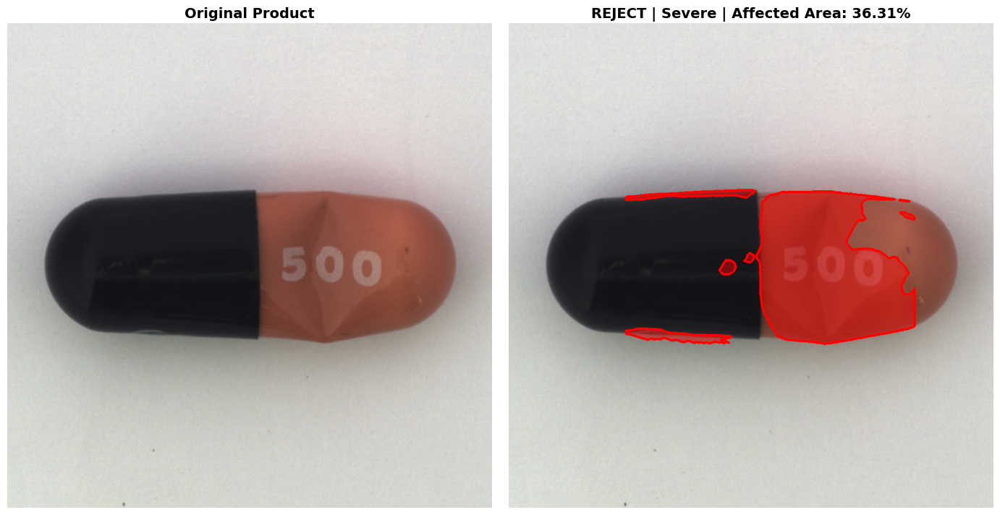

In [19]:
# ============================================================
# TEST FINAL INSPECTION ENGINE
# ============================================================

test_image = (
    "/kaggle/working/"
    "mvtec_yolo_seg_15cat/"
    "images/test/"
    "capsule_squeeze_006.png"
)

inspection_result = inspect_product_final(
    image_path=test_image,
    category="capsule"
)

In [20]:
# ============================================================
# FINAL TEST ACCURACY
# Industrial Quality Control
# ============================================================

from pathlib import Path
from ultralytics import YOLO

# ------------------------------------------------------------
# Paths
# ------------------------------------------------------------

MODEL_PATH = (
    "/kaggle/working/runs/"
    "industrial_defect_15cat_yolov8s_seg/"
    "weights/best.pt"
)

TEST_IMAGES = Path(
    "/kaggle/working/mvtec_yolo_seg_15cat/images/test"
)

TEST_LABELS = Path(
    "/kaggle/working/mvtec_yolo_seg_15cat/labels/test"
)

CONF_THRESHOLD = 0.05


# ------------------------------------------------------------
# Load model
# ------------------------------------------------------------

model = YOLO(MODEL_PATH)


# ------------------------------------------------------------
# Run prediction
# ------------------------------------------------------------

results = model.predict(
    source=str(TEST_IMAGES),
    imgsz=640,
    conf=CONF_THRESHOLD,
    device=0,
    batch=16,
    verbose=False
)


# ------------------------------------------------------------
# Calculate TP / TN / FP / FN
# ------------------------------------------------------------

TP = 0
TN = 0
FP = 0
FN = 0


for result in results:

    image_path = Path(result.path)

    label_path = (
        TEST_LABELS /
        f"{image_path.stem}.txt"
    )

    # Ground Truth:
    # non-empty label = defective
    # empty label     = good

    is_defective = bool(
        label_path.read_text().strip()
    )

    # Model prediction:
    # detection exists = defective

    predicted_defective = (
        len(result.boxes) > 0
    )


    if is_defective and predicted_defective:
        TP += 1

    elif not is_defective and not predicted_defective:
        TN += 1

    elif not is_defective and predicted_defective:
        FP += 1

    elif is_defective and not predicted_defective:
        FN += 1


# ------------------------------------------------------------
# Accuracy
# ------------------------------------------------------------

total = TP + TN + FP + FN

correct = TP + TN

accuracy = correct / total


# ------------------------------------------------------------
# Results
# ------------------------------------------------------------

print("=" * 60)
print("FINAL TEST ACCURACY")
print("=" * 60)

print(f"Test Images       : {total}")
print(f"Correct           : {correct}")
print(f"Incorrect         : {FP + FN}")

print("\nCONFUSION MATRIX")
print("-" * 60)

print(f"TP (Defect -> REJECT) : {TP}")
print(f"TN (Good   -> PASS)   : {TN}")
print(f"FP (Good   -> REJECT) : {FP}")
print(f"FN (Defect -> PASS)   : {FN}")

print("\n" + "=" * 60)

print(
    f"Accuracy = ({TP} + {TN}) / {total}"
)

print(
    f"Accuracy = {accuracy:.4f}"
)

print(
    f"FINAL ACCURACY = {accuracy * 100:.2f}%"
)

print("=" * 60)

FINAL TEST ACCURACY
Test Images       : 378
Correct           : 357
Incorrect         : 21

CONFUSION MATRIX
------------------------------------------------------------
TP (Defect -> REJECT) : 181
TN (Good   -> PASS)   : 176
FP (Good   -> REJECT) : 13
FN (Defect -> PASS)   : 8

Accuracy = (181 + 176) / 378
Accuracy = 0.9444
FINAL ACCURACY = 94.44%


In [25]:
import ipywidgets as widgets
from IPython.display import display, clear_output
from pathlib import Path
import cv2

# ============================================================
# EXTERNAL IMAGE UPLOADER + INSPECTION
# ============================================================

categories = [
    "bottle",
    "cable",
    "capsule",
    "carpet",
    "grid",
    "hazelnut",
    "leather",
    "metal_nut",
    "pill",
    "screw",
    "tile",
    "toothbrush",
    "transistor",
    "wood",
    "zipper"
]

# Choose product category
category_dropdown = widgets.Dropdown(
    options=categories,
    value="metal_nut",
    description="Category:"
)

# Upload image
uploader = widgets.FileUpload(
    accept=".jpg,.jpeg,.png,.webp",
    multiple=False,
    description="Choose Image"
)

# Run button
run_button = widgets.Button(
    description="Run Inspection",
    button_style="success"
)

output = widgets.Output()

display(category_dropdown)
display(uploader)
display(run_button)
display(output)


def run_external_inspection(button):

    with output:

        clear_output()

        if len(uploader.value) == 0:
            print("❌ اختار صورة الأول.")
            return

        # Get uploaded file
        uploaded_file = list(uploader.value)[0]

        filename = uploaded_file["name"]
        content = uploaded_file["content"]

        # Save temporarily in /kaggle/working
        save_dir = Path("/kaggle/working/external_uploads")
        save_dir.mkdir(parents=True, exist_ok=True)

        image_path = save_dir / filename

        with open(image_path, "wb") as f:
            f.write(content)

        print(f"Image saved: {image_path}")
        print(f"Category: {category_dropdown.value}")
        print("\nRunning model...\n")

        # Run our final inspection engine
        result = inspect_product_final(
            image_path=str(image_path),
            category=category_dropdown.value,
            model=model_final,
            conf_threshold=0.05,
            severity_threshold=5.0,
            show=True
        )

        print("\nExternal image inspection complete.")


run_button.on_click(run_external_inspection)

Dropdown(description='Category:', index=7, options=('bottle', 'cable', 'capsule', 'carpet', 'grid', 'hazelnut'…

FileUpload(value=(), accept='.jpg,.jpeg,.png,.webp', description='Choose Image')

Button(button_style='success', description='Run Inspection', style=ButtonStyle())

Output()

Using: /kaggle/working/external_uploads/Screenshot 2026-09-14 022809.png


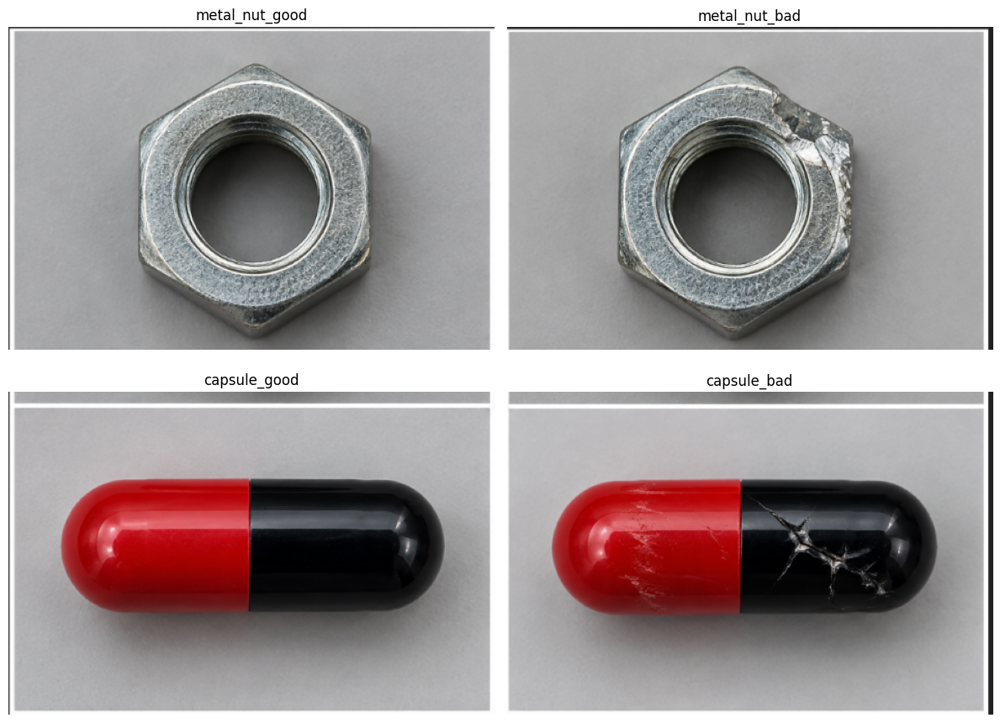


Saved successfully:
/kaggle/working/external_industrial_test/metal_nut_good.png
/kaggle/working/external_industrial_test/metal_nut_bad.png
/kaggle/working/external_industrial_test/capsule_good.png
/kaggle/working/external_industrial_test/capsule_bad.png


In [27]:
import cv2
from pathlib import Path
import matplotlib.pyplot as plt

# ============================================================
# GET LAST UPLOADED IMAGE
# ============================================================

upload_dir = Path("/kaggle/working/external_uploads")

images = []
for ext in ["*.png", "*.jpg", "*.jpeg", "*.webp"]:
    images.extend(upload_dir.glob(ext))

if not images:
    raise ValueError("ارفع الصورة الأول باستخدام Choose Image")

image_path = max(images, key=lambda p: p.stat().st_mtime)

print("Using:", image_path)

img = cv2.imread(str(image_path))

if img is None:
    raise ValueError("Could not read image")

h, w = img.shape[:2]

# ============================================================
# SPLIT 2x2
# ============================================================

crops = {
    "metal_nut_good": img[:h//2, :w//2],
    "metal_nut_bad":  img[:h//2, w//2:],
    "capsule_good":   img[h//2:, :w//2],
    "capsule_bad":    img[h//2:, w//2:]
}

output_dir = Path("/kaggle/working/external_industrial_test")
output_dir.mkdir(parents=True, exist_ok=True)

for name, crop in crops.items():
    cv2.imwrite(str(output_dir / f"{name}.png"), crop)

# Show images
fig, axes = plt.subplots(2, 2, figsize=(12, 9))

for ax, (name, crop) in zip(axes.flat, crops.items()):
    ax.imshow(cv2.cvtColor(crop, cv2.COLOR_BGR2RGB))
    ax.set_title(name)
    ax.axis("off")

plt.tight_layout()
plt.show()

print("\nSaved successfully:")
for name in crops:
    print(output_dir / f"{name}.png")

INDUSTRIAL QUALITY INSPECTION REPORT
Product Category        : metal_nut
Defect Detected         : Yes
Defect Regions          : 1
Confidence (%)          : 40.21
Inspection Area (px)    : 53082
Defect Area (px)        : 15089
Affected Area (%)       : 28.43
Severity                : Severe
Decision                : REJECT


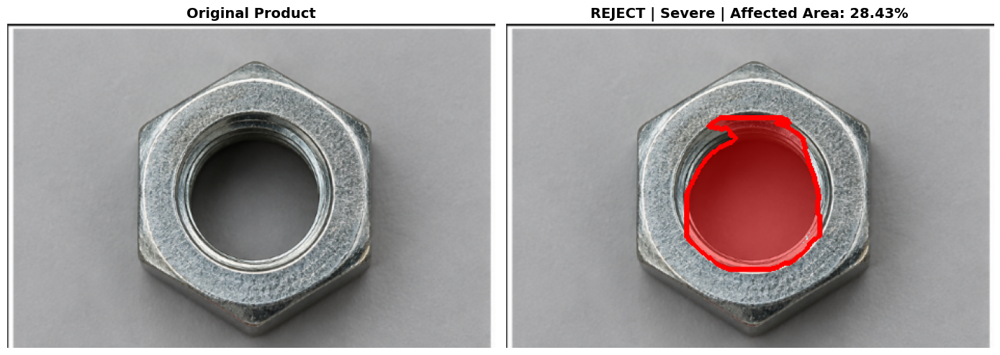

INDUSTRIAL QUALITY INSPECTION REPORT
Product Category        : metal_nut
Defect Detected         : Yes
Defect Regions          : 3
Confidence (%)          : 17.39
Inspection Area (px)    : 52815
Defect Area (px)        : 16497
Affected Area (%)       : 31.24
Severity                : Severe
Decision                : REJECT


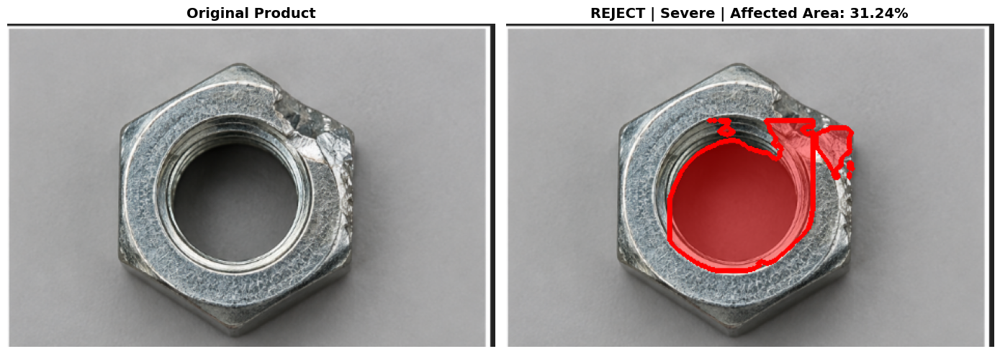

INDUSTRIAL QUALITY INSPECTION REPORT
Product Category        : capsule
Defect Detected         : Yes
Defect Regions          : 11
Confidence (%)          : 32.74
Inspection Area (px)    : 48098
Defect Area (px)        : 8628
Affected Area (%)       : 17.94
Severity                : Severe
Decision                : REJECT


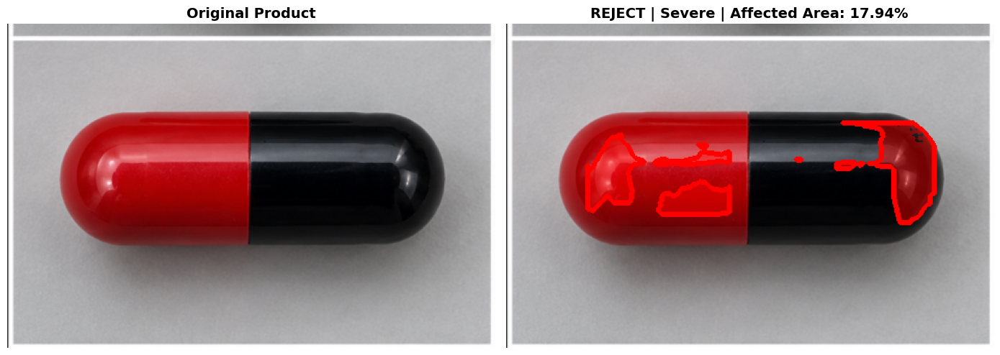

INDUSTRIAL QUALITY INSPECTION REPORT
Product Category        : capsule
Defect Detected         : Yes
Defect Regions          : 12
Confidence (%)          : 82.58
Inspection Area (px)    : 49448
Defect Area (px)        : 8274
Affected Area (%)       : 16.73
Severity                : Severe
Decision                : REJECT


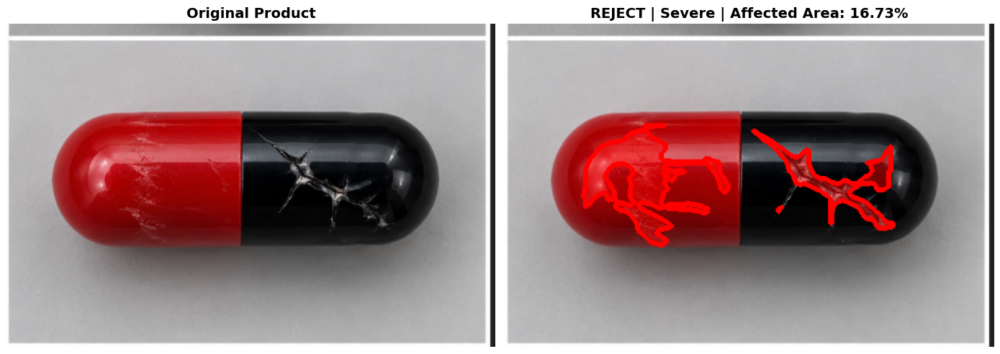

In [28]:
tests = [
    ("metal_nut_good", "metal_nut", "PASS"),
    ("metal_nut_bad",  "metal_nut", "REJECT"),
    ("capsule_good",   "capsule",   "PASS"),
    ("capsule_bad",    "capsule",   "REJECT")
]

results_external = []

for filename, category, expected in tests:

    path = (
        f"/kaggle/working/external_industrial_test/"
        f"{filename}.png"
    )

    result = inspect_product_final(
        image_path=path,
        category=category,
        model=model_final,
        conf_threshold=0.05,
        severity_threshold=5.0,
        show=True
    )

    predicted = result["report"]["Decision"]

    results_external.append({
        "Image": filename,
        "Expected": expected,
        "Predicted": predicted,
        "Correct": predicted == expected,
        "Confidence": result["report"]["Confidence (%)"],
        "Affected Area": result["report"]["Affected Area (%)"]
    })

In [30]:
from pathlib import Path
import torch
from ultralytics import YOLO

# ============================================================
# FINE-TUNING V2 — EXTERNAL GENERALIZATION
# ============================================================

BASE_MODEL = Path(
    "/kaggle/working/runs/"
    "industrial_defect_15cat_yolov8s_seg/"
    "weights/best.pt"
)

DATA_YAML = Path(
    "/kaggle/working/mvtec_yolo_seg_15cat/data.yaml"
)

print("Model exists :", BASE_MODEL.exists())
print("YAML exists  :", DATA_YAML.exists())

print("\nCUDA available:", torch.cuda.is_available())
print("GPU count:", torch.cuda.device_count())

for i in range(torch.cuda.device_count()):
    print(f"GPU {i}: {torch.cuda.get_device_name(i)}")

print("\nBase model:")
print(BASE_MODEL)

print("\nDataset:")
print(DATA_YAML)

Model exists : True
YAML exists  : True

CUDA available: True
GPU count: 2
GPU 0: Tesla T4
GPU 1: Tesla T4

Base model:
/kaggle/working/runs/industrial_defect_15cat_yolov8s_seg/weights/best.pt

Dataset:
/kaggle/working/mvtec_yolo_seg_15cat/data.yaml


In [31]:
# ============================================================
# MODEL V2
# FINE-TUNING FOR BETTER GENERALIZATION
# ============================================================

from ultralytics import YOLO
from pathlib import Path

BASE_MODEL = Path(
    "/kaggle/working/runs/"
    "industrial_defect_15cat_yolov8s_seg/"
    "weights/best.pt"
)

DATA_YAML = Path(
    "/kaggle/working/mvtec_yolo_seg_15cat/data.yaml"
)

RUNS_DIR = Path("/kaggle/working/runs")

# Load our already-trained model
model_v2 = YOLO(str(BASE_MODEL))

# Fine-tune
results_v2 = model_v2.train(

    data=str(DATA_YAML),

    # ----------------------------
    # Training
    # ----------------------------
    epochs=30,
    imgsz=640,
    batch=16,

    device=[0, 1],
    workers=4,

    optimizer="AdamW",

    # Lower LR because this is fine-tuning
    lr0=0.0002,
    lrf=0.01,

    weight_decay=0.0005,

    patience=10,

    # ----------------------------
    # GENERALIZATION AUGMENTATION
    # ----------------------------

    # lighting variation
    hsv_h=0.015,
    hsv_s=0.40,
    hsv_v=0.30,

    # geometry variation
    degrees=8.0,
    translate=0.10,
    scale=0.30,
    shear=2.0,
    perspective=0.0005,

    # Horizontal flip
    fliplr=0.5,

    # Don't vertically flip industrial products
    flipud=0.0,

    # Mix images / backgrounds
    mosaic=0.5,
    mixup=0.10,

    # Stop mosaic near the end
    close_mosaic=5,

    # ----------------------------
    # Other
    # ----------------------------

    seed=42,
    deterministic=True,

    project=str(RUNS_DIR),
    name="industrial_defect_15cat_V2_generalization",

    exist_ok=True,
    save=True,
    save_period=5,

    plots=True,
    verbose=True
)

print("\n" + "=" * 70)
print("V2 FINE-TUNING COMPLETE")
print("=" * 70)

print(
    "/kaggle/working/runs/"
    "industrial_defect_15cat_V2_generalization/"
    "weights/best.pt"
)

Ultralytics 8.4.150 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
                                                        CUDA:1 (Tesla T4, 14912MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=5, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mvtec_yolo_seg_15cat/data.yaml, degrees=8.0, deterministic=True, device=0,1, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.4, hsv_v=0.3, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0002, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.1, mode=train, model=/kagg

/usr/local/lib/python3.12/dist-packages/ray/train/_internal/session.py:676: UserWarning: `get_trial_id` is meant to only be called inside a function that is executed by a Tuner or Trainer. Returning `None`.
  warnings.warn(



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
       2/30      2.69G      1.151      2.088      1.011      1.225          0          6        640: 100% ━━━━━━━━━━━━ 110/110 2.9it/s 37.6s0.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 2.0it/s 6.1s0.3s
                   all        378        292      0.806      0.654      0.715       0.42      0.789      0.623      0.701      0.339

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
       3/30      2.69G      1.187      2.138      1.064      1.234          0          6        640: 100% ━━━━━━━━━━━━ 110/110 2.9it/s 37.7s0.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 2.2it/s 5.6s0.4s
                   all   

In [32]:
# ============================================================
# V2 - FINAL TEST SET EVALUATION
# ============================================================

from ultralytics import YOLO
from pathlib import Path

V2_MODEL_PATH = (
    "/kaggle/working/runs/"
    "industrial_defect_15cat_V2_generalization/"
    "weights/best.pt"
)

DATA_YAML = (
    "/kaggle/working/mvtec_yolo_seg_15cat/data.yaml"
)

model_v2_final = YOLO(V2_MODEL_PATH)

test_metrics_v2 = model_v2_final.val(
    data=DATA_YAML,
    split="test",
    imgsz=640,
    batch=16,
    device=0,
    conf=0.001,
    plots=True,
    verbose=False
)

print("=" * 60)
print("V2 SEGMENTATION - TEST SET")
print("=" * 60)

print("\nBOX")
print(f"Precision     : {test_metrics_v2.box.mp:.4f}")
print(f"Recall        : {test_metrics_v2.box.mr:.4f}")
print(f"mAP50         : {test_metrics_v2.box.map50:.4f}")
print(f"mAP50-95      : {test_metrics_v2.box.map:.4f}")

print("\nMASK")
print(f"Precision     : {test_metrics_v2.seg.mp:.4f}")
print(f"Recall        : {test_metrics_v2.seg.mr:.4f}")
print(f"mAP50         : {test_metrics_v2.seg.map50:.4f}")
print(f"mAP50-95      : {test_metrics_v2.seg.map:.4f}")

Ultralytics 8.4.150 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
YOLOv8s-seg summary (fused): 85 layers, 11,779,987 parameters, 0 gradients, 39.9 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 5078.3±563.3 MB/s, size: 943.0 KB)
val: Scanning /kaggle/working/mvtec_yolo_seg_15cat/labels/test.cache... 378 images, 189 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 378/378 113.2Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 24/24 2.6it/s 9.4s0.3s
                   all        378        287      0.851      0.796      0.864      0.533      0.832      0.777      0.832      0.449
Speed: 2.0ms preprocess, 12.4ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to /kaggle/working/runs/segment/val-2
V2 SEGMENTATION - TEST SET

BOX
Precision     : 0.8510
Recall        : 0.7960
mAP50         : 0.8639
mAP50-95      : 0.5330

MASK
Precision     : 

In [33]:
# ============================================================
# V2 IMAGE-LEVEL QC - LOCKED CONF = 0.05
# ============================================================

TEST_IMAGES = Path(
    "/kaggle/working/mvtec_yolo_seg_15cat/images/test"
)

TEST_LABELS = Path(
    "/kaggle/working/mvtec_yolo_seg_15cat/labels/test"
)

CONF_THRESHOLD = 0.05

results = model_v2_final.predict(
    source=str(TEST_IMAGES),
    imgsz=640,
    conf=CONF_THRESHOLD,
    device=0,
    batch=16,
    verbose=False
)

TP = TN = FP = FN = 0

for result in results:

    image_path = Path(result.path)
    label_path = TEST_LABELS / f"{image_path.stem}.txt"

    actual_defective = bool(
        label_path.read_text().strip()
    )

    predicted_defective = len(result.boxes) > 0

    if actual_defective and predicted_defective:
        TP += 1

    elif not actual_defective and not predicted_defective:
        TN += 1

    elif not actual_defective and predicted_defective:
        FP += 1

    else:
        FN += 1


accuracy = (TP + TN) / (TP + TN + FP + FN)
precision = TP / (TP + FP) if TP + FP else 0
recall = TP / (TP + FN) if TP + FN else 0
specificity = TN / (TN + FP) if TN + FP else 0
f1 = (
    2 * precision * recall / (precision + recall)
    if precision + recall else 0
)

print("=" * 60)
print("V2 IMAGE-LEVEL QUALITY CONTROL")
print("=" * 60)

print(f"TP : {TP}")
print(f"TN : {TN}")
print(f"FP : {FP}")
print(f"FN : {FN}")

print("-" * 60)

print(f"Accuracy    : {accuracy*100:.2f}%")
print(f"Precision   : {precision*100:.2f}%")
print(f"Recall      : {recall*100:.2f}%")
print(f"Specificity : {specificity*100:.2f}%")
print(f"F1 Score    : {f1*100:.2f}%")

print("=" * 60)

V2 IMAGE-LEVEL QUALITY CONTROL
TP : 186
TN : 165
FP : 24
FN : 3
------------------------------------------------------------
Accuracy    : 92.86%
Precision   : 88.57%
Recall      : 98.41%
Specificity : 87.30%
F1 Score    : 93.23%


In [34]:
# ============================================================
# STEP 1 — PREPARE V3 HARD-NEGATIVE DATASET
# Keep V1/V2 untouched
# ============================================================

from pathlib import Path
import shutil

SOURCE = Path("/kaggle/working/mvtec_yolo_seg_15cat")
V3_DATA = Path("/kaggle/working/mvtec_yolo_seg_V3")

# Remove old unfinished V3 if exists
if V3_DATA.exists():
    shutil.rmtree(V3_DATA)

# Copy complete original dataset
shutil.copytree(SOURCE, V3_DATA)

print("=" * 60)
print("V3 DATASET CREATED")
print("=" * 60)

for split in ["train", "val", "test"]:

    images = list((V3_DATA / "images" / split).glob("*"))
    labels = list((V3_DATA / "labels" / split).glob("*.txt"))

    print(
        f"{split.upper():5s} | "
        f"Images: {len(images):4d} | "
        f"Labels: {len(labels):4d}"
    )

print("\nV1 model remains untouched:")
print(
    "/kaggle/working/runs/"
    "industrial_defect_15cat_yolov8s_seg/"
    "weights/best.pt"
)

V3 DATASET CREATED
TRAIN | Images: 1760 | Labels: 1760
VAL   | Images:  378 | Labels:  378
TEST  | Images:  378 | Labels:  378

V1 model remains untouched:
/kaggle/working/runs/industrial_defect_15cat_yolov8s_seg/weights/best.pt


In [35]:
# ============================================================
# V3 - ADD UNUSED MVTec GOOD IMAGES AS HARD NEGATIVES
# ============================================================

from pathlib import Path
import shutil
import random

random.seed(42)

MVTEC_ROOT = Path("/kaggle/input/datasets/ipythonx/mvtec-ad")
V3_ROOT = Path("/kaggle/working/mvtec_yolo_seg_V3")

TRAIN_IMAGES = V3_ROOT / "images/train"
TRAIN_LABELS = V3_ROOT / "labels/train"

categories = [
    "bottle", "cable", "capsule", "carpet", "grid",
    "hazelnut", "leather", "metal_nut", "pill", "screw",
    "tile", "toothbrush", "transistor", "wood", "zipper"
]

# Give extra emphasis to categories where external FP is a concern.
TARGETS = {
    "bottle": 60,
    "cable": 60,
    "capsule": 100,
    "carpet": 50,
    "grid": 50,
    "hazelnut": 60,
    "leather": 50,
    "metal_nut": 100,
    "pill": 60,
    "screw": 100,
    "tile": 60,
    "toothbrush": 40,
    "transistor": 80,
    "wood": 60,
    "zipper": 60,
}

image_extensions = {".png", ".jpg", ".jpeg", ".bmp", ".tif", ".tiff"}

# ------------------------------------------------------------
# Find original MVTec good folders automatically
# ------------------------------------------------------------

def find_good_folder(category):

    candidates = [
        MVTEC_ROOT / category / "train/good",
        MVTEC_ROOT / category / category / "train/good",
    ]

    for p in candidates:
        if p.exists():
            return p

    # fallback recursive search
    matches = [
        p for p in MVTEC_ROOT.rglob("good")
        if p.is_dir()
        and p.parent.name == "train"
        and category in p.parts
    ]

    if not matches:
        raise FileNotFoundError(
            f"Could not find train/good for {category}"
        )

    return matches[0]


# ------------------------------------------------------------
# Detect which original good stems are already present
# ------------------------------------------------------------

def original_stem_from_v3_name(filename, category):

    stem = Path(filename).stem

    # Existing names normally contain category_good_<original stem>
    prefix = f"{category}_good_"

    if stem.startswith(prefix):
        return stem[len(prefix):]

    return None


print("=" * 75)
print("BUILDING V3 HARD-NEGATIVE BANK")
print("=" * 75)

added_by_category = {}
total_added = 0

for category in categories:

    good_dir = find_good_folder(category)

    original_good = [
        p for p in good_dir.iterdir()
        if p.is_file() and p.suffix.lower() in image_extensions
    ]

    # Original stems already used in our V3 dataset
    used_stems = set()

    for split in ["train", "val", "test"]:

        split_dir = V3_ROOT / "images" / split

        for p in split_dir.glob(f"{category}_good_*"):

            original_stem = original_stem_from_v3_name(
                p.name,
                category
            )

            if original_stem is not None:
                used_stems.add(original_stem)

    # Only genuinely unused originals
    unused = [
        p for p in original_good
        if p.stem not in used_stems
    ]

    random.shuffle(unused)

    requested = TARGETS[category]
    selected = unused[:requested]

    added = 0

    for src in selected:

        new_name = (
            f"hardneg_{category}_{src.stem}"
            f"{src.suffix.lower()}"
        )

        dst_image = TRAIN_IMAGES / new_name
        dst_label = TRAIN_LABELS / f"{Path(new_name).stem}.txt"

        # Copy image
        shutil.copy2(src, dst_image)

        # EMPTY label = normal / no defect
        dst_label.write_text("")

        added += 1

    added_by_category[category] = added
    total_added += added

    print(
        f"{category:<12} | "
        f"Available unused: {len(unused):3d} | "
        f"Requested: {requested:3d} | "
        f"Added: {added:3d}"
    )


# ------------------------------------------------------------
# Final integrity check
# ------------------------------------------------------------

print("\n" + "=" * 75)

for split in ["train", "val", "test"]:

    images = [
        p for p in (V3_ROOT / "images" / split).iterdir()
        if p.is_file() and p.suffix.lower() in image_extensions
    ]

    labels = list(
        (V3_ROOT / "labels" / split).glob("*.txt")
    )

    empty_labels = sum(
        1 for p in labels
        if not p.read_text().strip()
    )

    print(
        f"{split.upper():5s} | "
        f"Images: {len(images):4d} | "
        f"Labels: {len(labels):4d} | "
        f"Empty labels: {empty_labels:4d}"
    )

print("=" * 75)

print(f"\nTOTAL HARD NEGATIVES ADDED: {total_added}")

print("\nAdded by category:")
for category, n in added_by_category.items():
    print(f"{category:<12}: {n}")

BUILDING V3 HARD-NEGATIVE BANK
bottle       | Available unused: 125 | Requested:  60 | Added:  60
cable        | Available unused: 139 | Requested:  60 | Added:  60
capsule      | Available unused: 134 | Requested: 100 | Added: 100
carpet       | Available unused: 193 | Requested:  50 | Added:  50
grid         | Available unused: 178 | Requested:  50 | Added:  50
hazelnut     | Available unused: 305 | Requested:  60 | Added:  60
leather      | Available unused: 159 | Requested:  50 | Added:  50
metal_nut    | Available unused: 134 | Requested: 100 | Added: 100
pill         | Available unused: 180 | Requested:  60 | Added:  60
screw        | Available unused: 235 | Requested: 100 | Added: 100
tile         | Available unused: 144 | Requested:  60 | Added:  60
toothbrush   | Available unused:   0 | Requested:  40 | Added:   0
transistor   | Available unused: 127 | Requested:  80 | Added:  80
wood         | Available unused: 162 | Requested:  60 | Added:  60
zipper       | Available unused

In [ ]:
# ============================================================
# V3 - HARD NEGATIVE FINE-TUNING
# Start from V1, NOT V2
# ============================================================

from pathlib import Path
from ultralytics import YOLO
import yaml
import torch

# ------------------------------------------------------------
# Paths
# ------------------------------------------------------------

V1_MODEL = Path(
    "/kaggle/working/runs/"
    "industrial_defect_15cat_yolov8s_seg/"
    "weights/best.pt"
)

V3_ROOT = Path(
    "/kaggle/working/mvtec_yolo_seg_V3"
)

V3_YAML = V3_ROOT / "data.yaml"

RUNS_DIR = Path("/kaggle/working/runs")


# ------------------------------------------------------------
# Create V3 data.yaml
# ------------------------------------------------------------

data_config = {
    "path": str(V3_ROOT),
    "train": "images/train",
    "val": "images/val",
    "test": "images/test",
    "names": {
        0: "defect"
    }
}

with open(V3_YAML, "w") as f:
    yaml.safe_dump(
        data_config,
        f,
        sort_keys=False
    )


# ------------------------------------------------------------
# Pre-check
# ------------------------------------------------------------

print("=" * 70)
print("V3 HARD-NEGATIVE FINE-TUNING")
print("=" * 70)

print("V1 exists :", V1_MODEL.exists())
print("V3 YAML   :", V3_YAML.exists())
print("CUDA      :", torch.cuda.is_available())
print("GPUs      :", torch.cuda.device_count())

for i in range(torch.cuda.device_count()):
    print(
        f"GPU {i}:",
        torch.cuda.get_device_name(i)
    )

print("\nStarting model:")
print(V1_MODEL)

print("\nDataset:")
print(V3_YAML)

print("=" * 70)


# ------------------------------------------------------------
# Load V1
# ------------------------------------------------------------

model_v3 = YOLO(str(V1_MODEL))


# ------------------------------------------------------------
# Fine-tune
# ------------------------------------------------------------

results_v3 = model_v3.train(

    data=str(V3_YAML),

    # Fine-tuning
    epochs=30,
    imgsz=640,
    batch=16,

    device=[0, 1],
    workers=4,

    optimizer="AdamW",

    # Lower LR because we're fine-tuning V1
    lr0=0.0001,
    lrf=0.01,

    weight_decay=0.0005,

    # Stop if no useful improvement
    patience=10,

    # --------------------------------------------------------
    # LIGHT augmentation
    # Much less aggressive than V2
    # --------------------------------------------------------

    hsv_h=0.008,
    hsv_s=0.20,
    hsv_v=0.15,

    degrees=3.0,
    translate=0.05,
    scale=0.15,

    shear=0.0,
    perspective=0.0,

    fliplr=0.3,
    flipud=0.0,

    # Avoid aggressive synthetic combinations
    mosaic=0.2,
    mixup=0.0,

    close_mosaic=5,

    # --------------------------------------------------------
    # Reproducibility
    # --------------------------------------------------------

    seed=42,
    deterministic=True,

    # --------------------------------------------------------
    # Output
    # --------------------------------------------------------

    project=str(RUNS_DIR),

    name="industrial_defect_15cat_V3_hardnegative",

    exist_ok=True,

    save=True,
    save_period=5,

    plots=True,
    verbose=True
)


print("\n" + "=" * 70)
print("V3 TRAINING COMPLETE")
print("=" * 70)

print(
    "/kaggle/working/runs/"
    "industrial_defect_15cat_V3_hardnegative/"
    "weights/best.pt"
)

V3 HARD-NEGATIVE FINE-TUNING
V1 exists : True
V3 YAML   : True
CUDA      : True
GPUs      : 2
GPU 0: Tesla T4
GPU 1: Tesla T4

Starting model:
/kaggle/working/runs/industrial_defect_15cat_yolov8s_seg/weights/best.pt

Dataset:
/kaggle/working/mvtec_yolo_seg_V3/data.yaml
Ultralytics 8.4.150 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
                                                        CUDA:1 (Tesla T4, 14912MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=5, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mvtec_yolo_seg_V3/data.yaml, degrees=3.0, deterministic=True, device=0,1, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.

/usr/local/lib/python3.12/dist-packages/ray/train/_internal/session.py:676: UserWarning: `get_trial_id` is meant to only be called inside a function that is executed by a Tuner or Trainer. Returning `None`.
  warnings.warn(



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
       2/30      2.66G     0.9822      1.528     0.7706      1.111          0          1        640: 100% ━━━━━━━━━━━━ 170/170 3.3it/s 51.4s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 2.0it/s 6.2s0.4s
                   all        378        292       0.79      0.712      0.741      0.437      0.791      0.695      0.759      0.403

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
       3/30      2.66G     0.9041        1.4     0.6583      1.047          0          3        640: 100% ━━━━━━━━━━━━ 170/170 3.2it/s 52.5s0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 2.3it/s 5.3s0.3s
                   all 